# Supplementary Figure - Vary Recurrent Noise of RNN

May 24, 2022

In [1]:
folder = 'figs-2022-5-24/'

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FixedLocator,FixedFormatter
import matplotlib.pylab as pylab

# analysis
from sklearn.decomposition import PCA, FactorAnalysis
from sklearn.linear_model import LinearRegression
from scipy import interpolate # don't import stats
from scipy import linalg as LA
from scipy.ndimage.filters import uniform_filter1d

# miscellaneous
from tqdm import tqdm
from itertools import cycle
from copy import deepcopy
import pickle

import logging
import warnings
import dataclasses
from dataclasses import dataclass
from typing import Optional, List

import sys
sys.path.append("../..")

In [3]:
from rnn import RNNparams, RNN
from task import Task
from simulation import Simulation
from algorithms.bptt import BPTT
from algorithms.rflo import RFLO
from algorithms.reinforce import REINFORCE
from algorithms.track_vars import TrackVars

from utils.plotting import plot_trained_trajectories, paper_format
from utils.metric import cos_sim, return_norm_and_angle
from utils.functions import choose_aligned_matrix

from utils.metric import cos_sim, flow_field_data, flow_field_predicted, calculate_flow_field_correlation


# Vary Recurrent noise of RFLO with fixed M

In [4]:
trial_duration = 20
n_in=4
frac_on = 0.2

x_tonic = 0.0*np.ones((trial_duration, n_in)) # shape 20 x 4 i.e. time x channel
x_pulse1 = x_tonic.copy()
x_pulse2 = x_tonic.copy()
x_pulse3 = x_tonic.copy()
x_pulse4 = x_tonic.copy()
x_pulse1[0:int(trial_duration*frac_on),0] = 1
x_pulse2[0:int(trial_duration*frac_on),1] = 1
x_pulse3[0:int(trial_duration*frac_on),2] = 1
x_pulse4[0:int(trial_duration*frac_on),3] = 1

task1 = Task(x_in=x_pulse1,y_target=np.asarray([[1],[1]]))
task2 = Task(x_in=x_pulse2,y_target=np.asarray([[-1],[1]]))
task3 = Task(x_in=x_pulse3,y_target=np.asarray([[1],[-1]]))
task4 = Task(x_in=x_pulse4,y_target=np.asarray([[-1],[-1]]))

5it [00:00, 49.65it/s]

n_in: 4
n_rec: 50
n_out: 2
sig_in: 0.0
sig_rec: 0.25
sig_out: 0.01
tau_rec: 10
dt: 1.0
eta_in: 0.1
eta_rec: 0.1
eta_out: 0.1
g_in: 2.0
g_rec: 1.5
g_out: 2.0
g_fb: 2.0
driving_feedback: False
eta_fb: None
sig_fb: None
feedback_signal: position
velocity_transform: False
tau_vel: 0.8
dt_vel: 0.1
sig_rec_dim: None
eta_m: None
sig_m: None
lam_m: None
rng: <mtrand.RandomState object at 0x7fbc26f34c18>
>>net0, not linear


2500it [00:29, 85.28it/s]
8it [00:00, 77.76it/s]

>> sig_rec: 0.01
M norm: 1.21	 M angle: 0.49, 34 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.21	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.85	 w_out vs. w_m angle: 0.11

500it [00:04, 122.11it/s]
1500it [00:16, 90.65it/s]
500it [00:04, 112.34it/s]


AR early fit 0.978, late fit 0.987


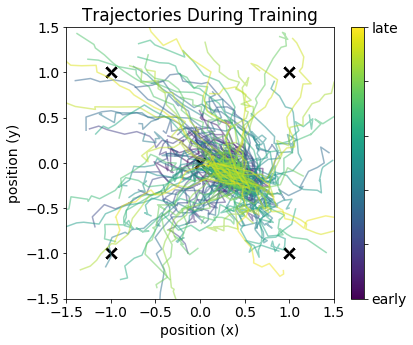

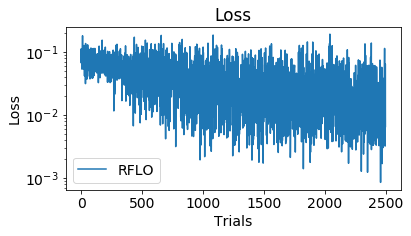

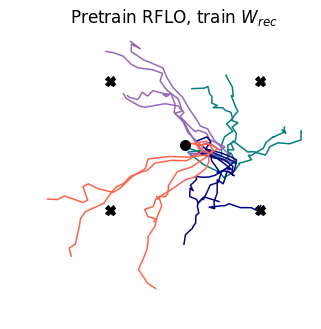

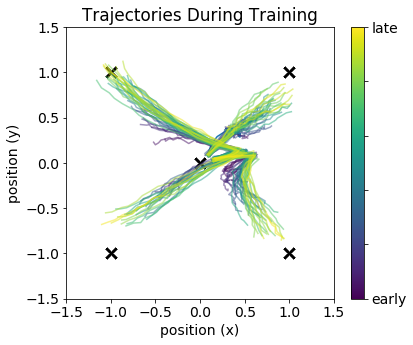

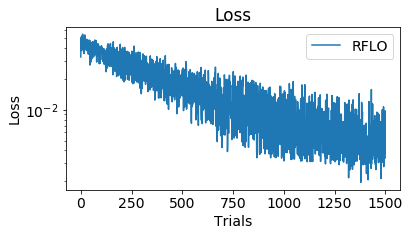

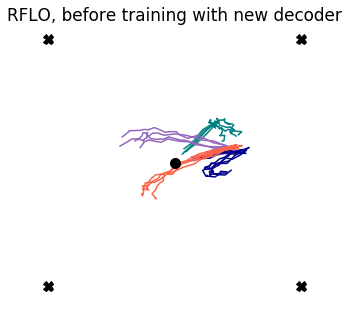

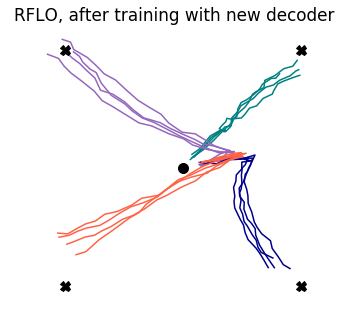

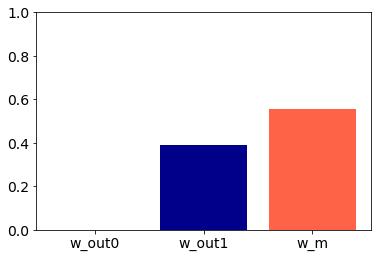

9it [00:00, 87.02it/s]

>> sig_rec: 0.05
M norm: 1.21	 M angle: 0.49, 34 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.21	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.85	 w_out vs. w_m angle: 0.11

500it [00:04, 105.85it/s]
1500it [00:25, 58.08it/s]
500it [00:06, 72.97it/s]


AR early fit 0.965, late fit 0.978


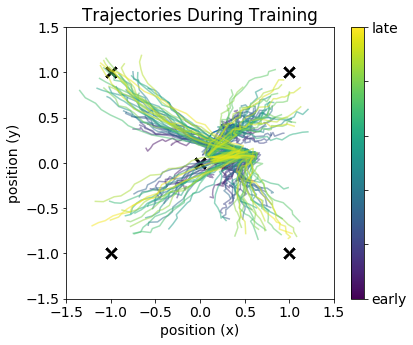

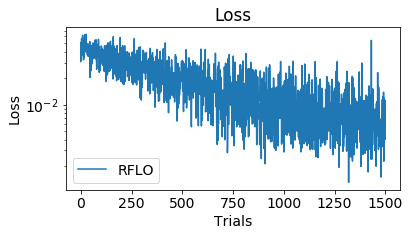

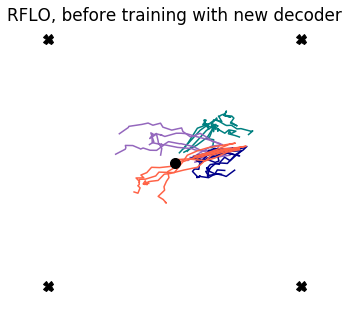

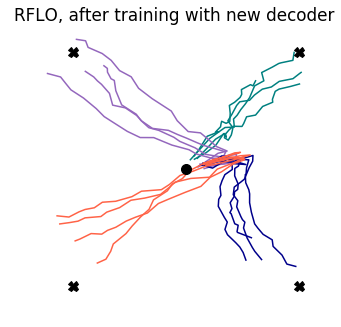

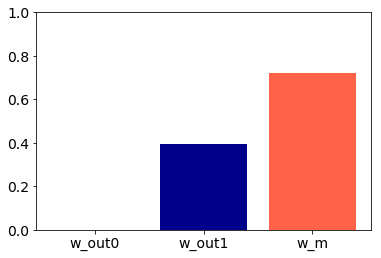

6it [00:00, 57.08it/s]

>> sig_rec: 0.10
M norm: 1.21	 M angle: 0.49, 34 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.21	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.85	 w_out vs. w_m angle: 0.11

500it [00:08, 61.33it/s]
1500it [00:22, 67.58it/s]
500it [00:07, 67.14it/s]


AR early fit 0.953, late fit 0.968


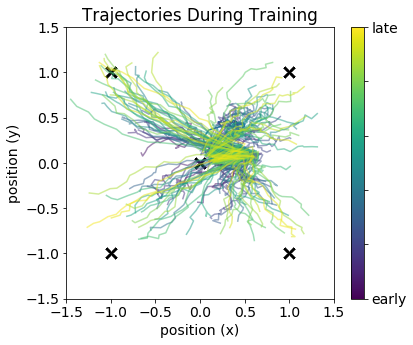

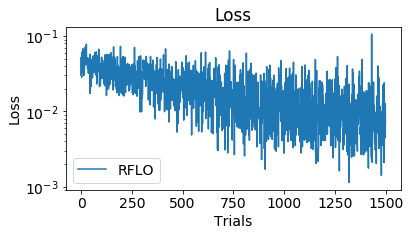

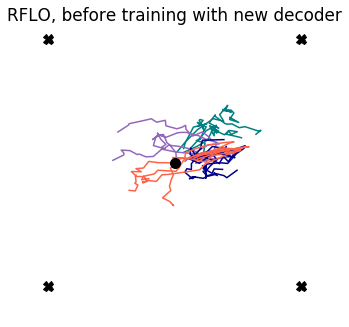

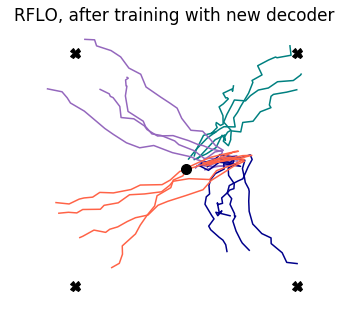

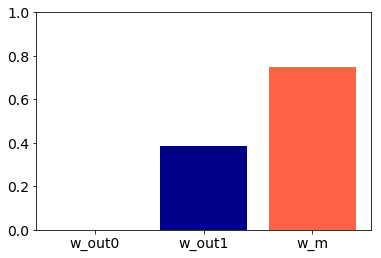

7it [00:00, 68.27it/s]

>> sig_rec: 0.25
M norm: 1.21	 M angle: 0.49, 34 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.21	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.85	 w_out vs. w_m angle: 0.11

500it [00:06, 71.49it/s]
1500it [00:21, 69.36it/s]
500it [00:03, 125.01it/s]


AR early fit 0.929, late fit 0.944


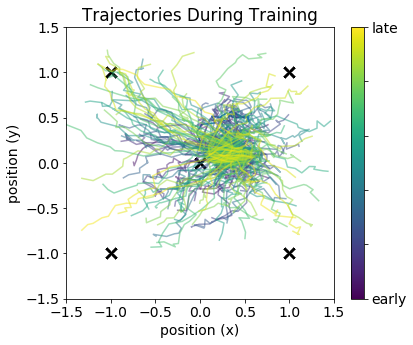

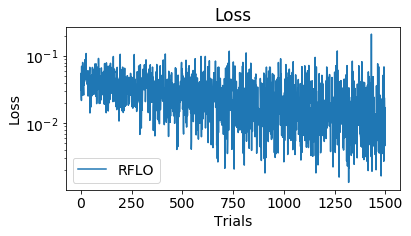

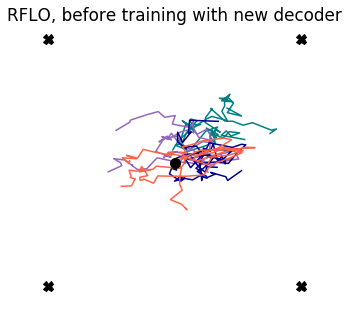

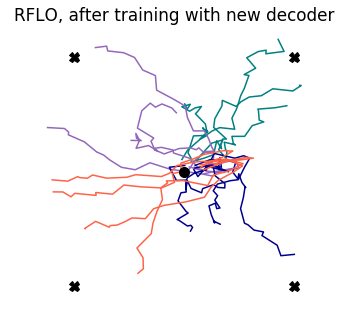

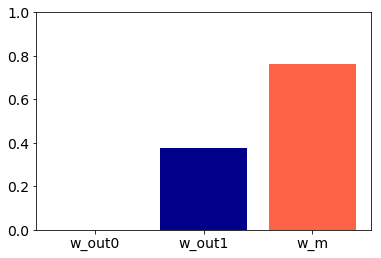

9it [00:00, 88.04it/s]

>> sig_rec: 0.50
M norm: 1.21	 M angle: 0.49, 34 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.21	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.85	 w_out vs. w_m angle: 0.11

500it [00:04, 121.02it/s]
1500it [00:19, 77.20it/s]
500it [00:04, 111.08it/s]


AR early fit 0.906, late fit 0.917


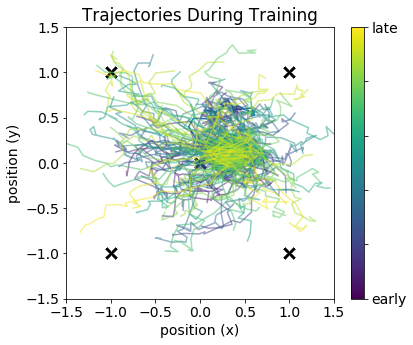

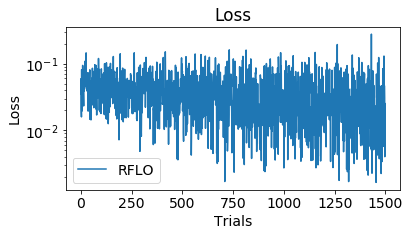

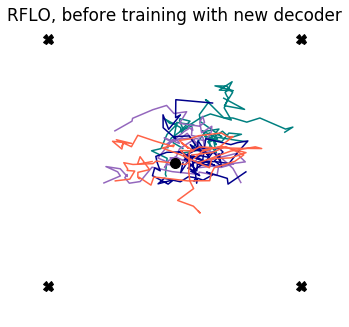

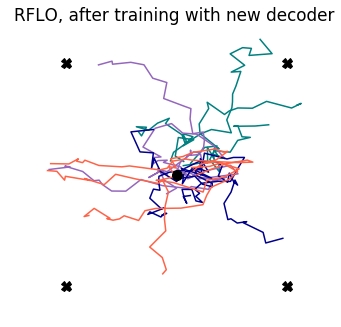

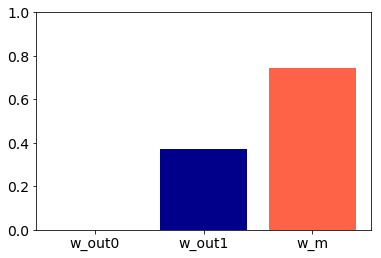

9it [00:00, 84.69it/s]

>> sig_rec: 0.01
M norm: 1.19	 M angle: 0.50, 36 iterations
w_out1 norm: 1.51	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.19	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.72	 w_out vs. w_m angle: 0.26

500it [00:04, 102.94it/s]
1500it [00:16, 92.79it/s]
500it [00:04, 125.66it/s]


AR early fit 0.979, late fit 0.988


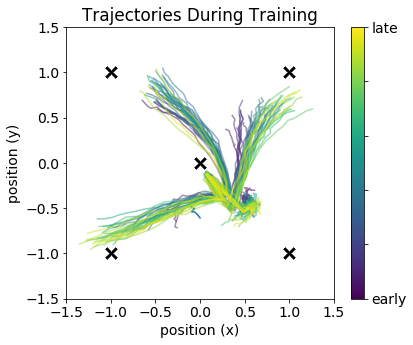

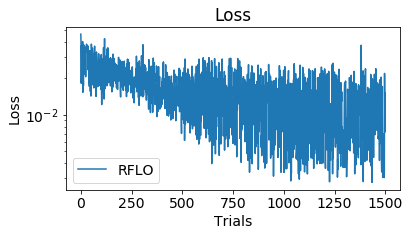

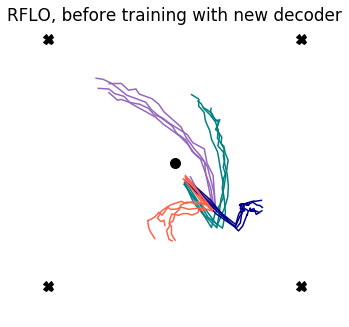

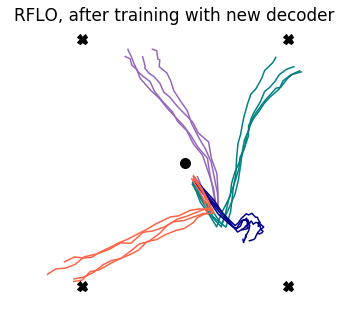

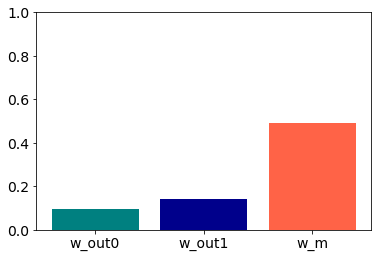

9it [00:00, 88.85it/s]

>> sig_rec: 0.05
M norm: 1.19	 M angle: 0.50, 36 iterations
w_out1 norm: 1.51	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.19	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.72	 w_out vs. w_m angle: 0.26

500it [00:04, 120.00it/s]
1500it [00:15, 93.82it/s]
500it [00:04, 121.98it/s]


AR early fit 0.965, late fit 0.978


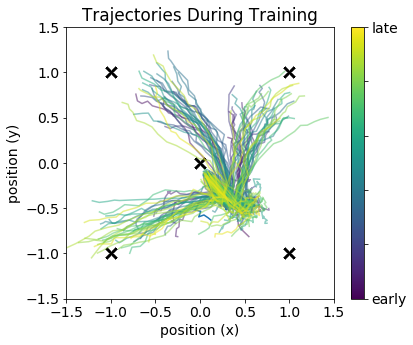

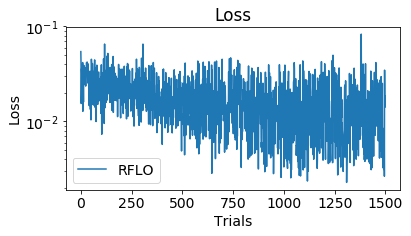

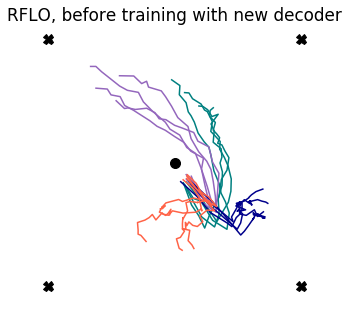

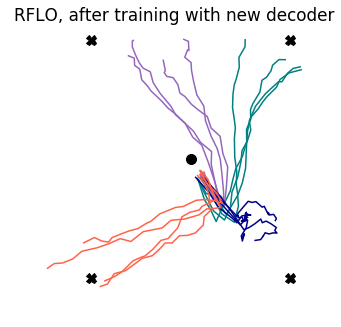

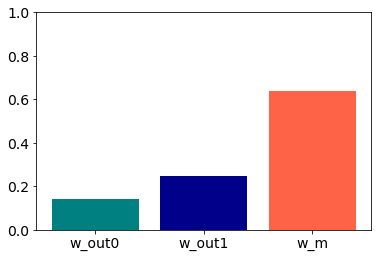

8it [00:00, 74.86it/s]

>> sig_rec: 0.10
M norm: 1.19	 M angle: 0.50, 36 iterations
w_out1 norm: 1.51	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.19	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.72	 w_out vs. w_m angle: 0.26

500it [00:04, 111.89it/s]
1500it [00:16, 88.88it/s]
500it [00:04, 109.18it/s]


AR early fit 0.953, late fit 0.968


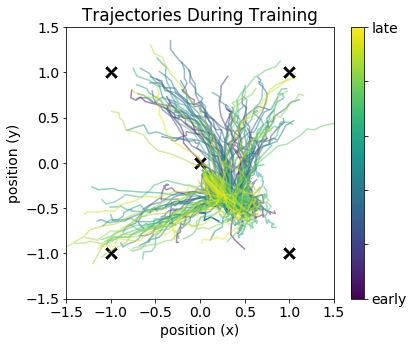

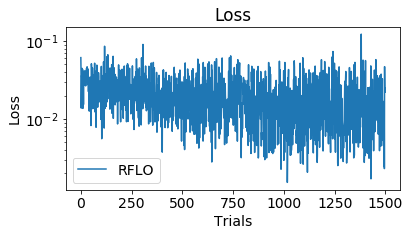

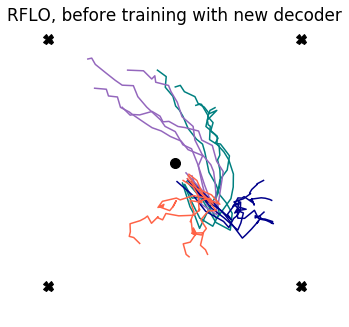

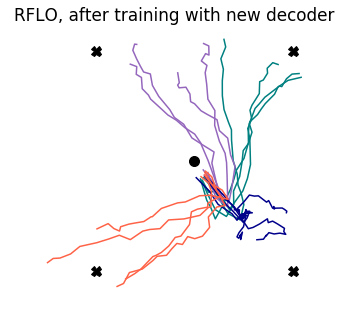

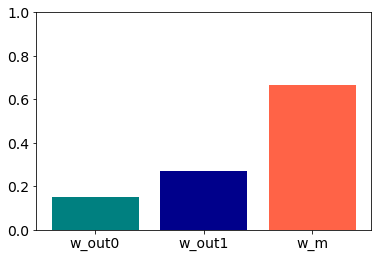

9it [00:00, 85.12it/s]

>> sig_rec: 0.25
M norm: 1.19	 M angle: 0.50, 36 iterations
w_out1 norm: 1.51	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.19	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.72	 w_out vs. w_m angle: 0.26

500it [00:04, 113.51it/s]
1500it [00:23, 65.17it/s]
500it [00:04, 104.90it/s]


AR early fit 0.928, late fit 0.942


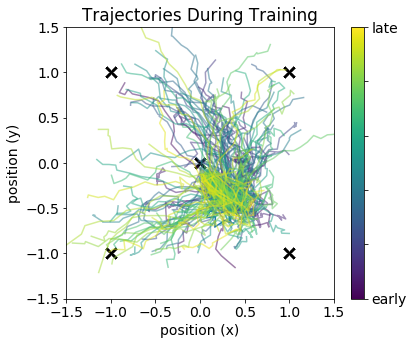

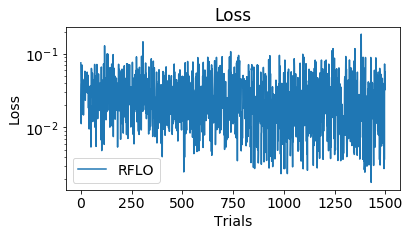

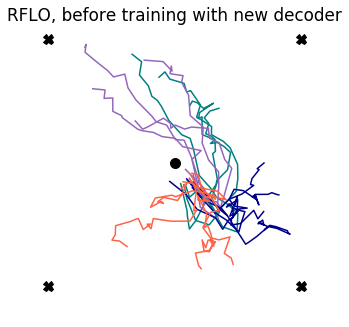

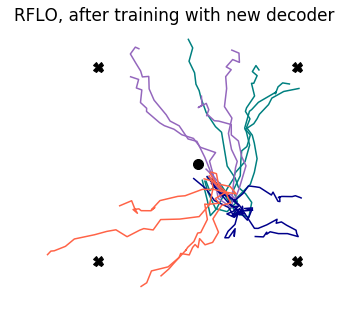

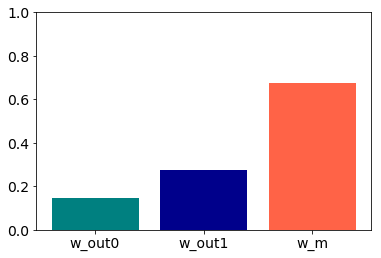

6it [00:00, 56.49it/s]

>> sig_rec: 0.50
M norm: 1.19	 M angle: 0.50, 36 iterations
w_out1 norm: 1.51	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.19	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.72	 w_out vs. w_m angle: 0.26

500it [00:04, 113.24it/s]
1500it [00:16, 91.13it/s]
500it [00:04, 102.35it/s]


AR early fit 0.904, late fit 0.914


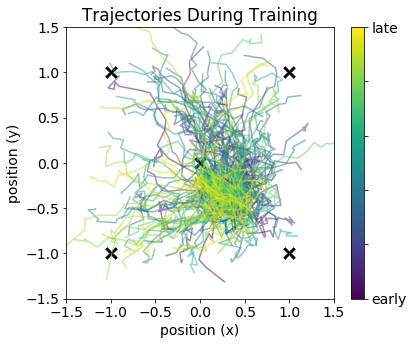

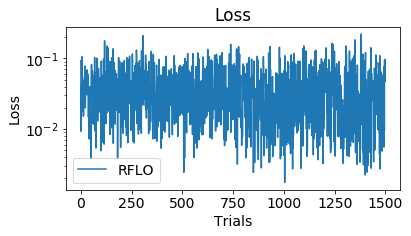

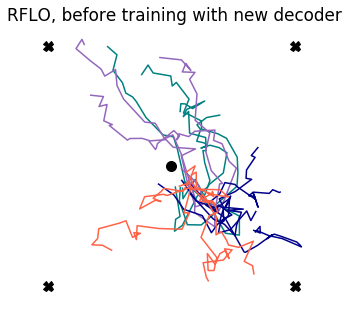

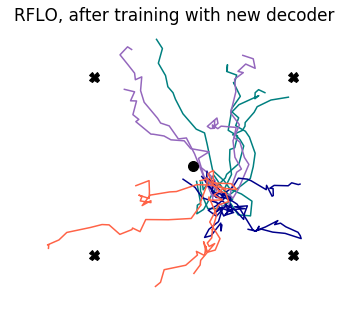

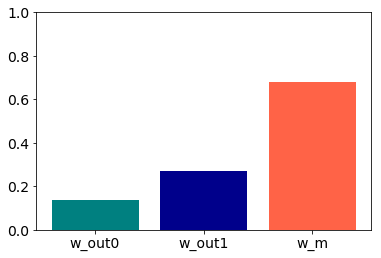

9it [00:00, 84.79it/s]

>> sig_rec: 0.01
M norm: 1.20	 M angle: 0.50, 3 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.20	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.73	 w_out vs. w_m angle: 0.26

500it [00:04, 126.90it/s]
1500it [00:16, 91.32it/s]
500it [00:04, 120.26it/s]


AR early fit 0.979, late fit 0.989


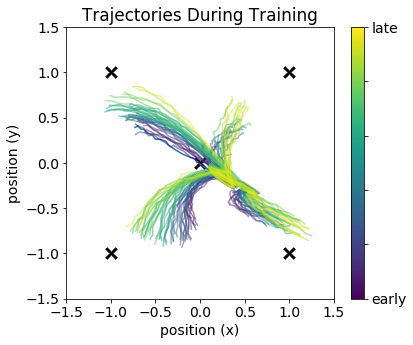

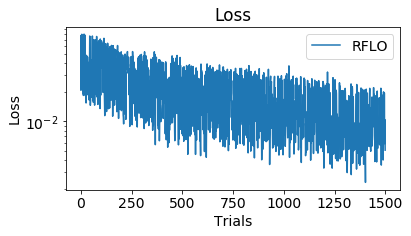

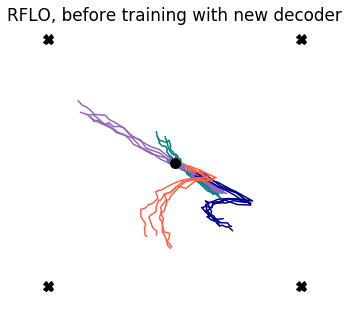

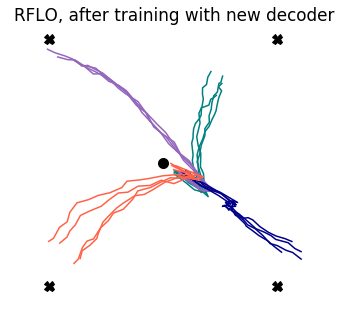

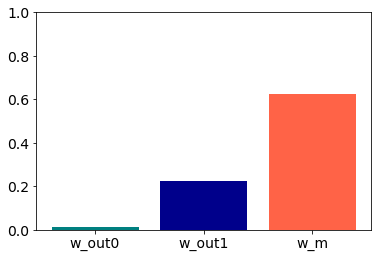

12it [00:00, 116.81it/s]

>> sig_rec: 0.05
M norm: 1.20	 M angle: 0.50, 3 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.20	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.73	 w_out vs. w_m angle: 0.26

500it [00:04, 121.40it/s]
1500it [00:16, 78.76it/s]
500it [00:04, 117.55it/s]


AR early fit 0.965, late fit 0.981


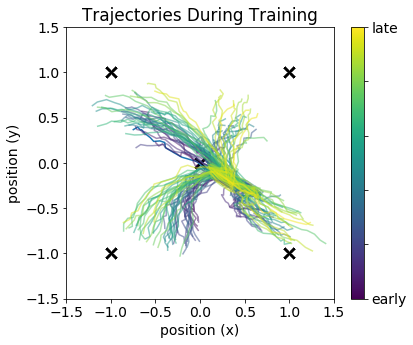

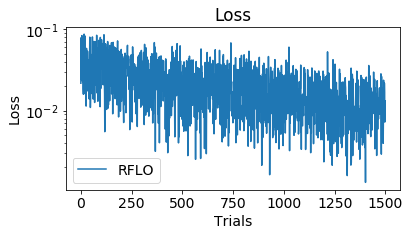

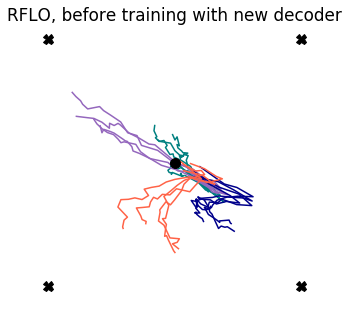

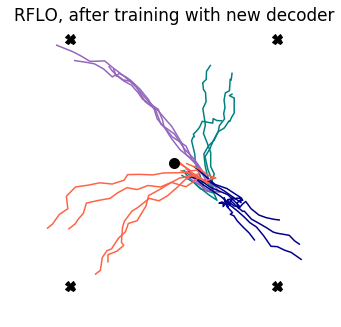

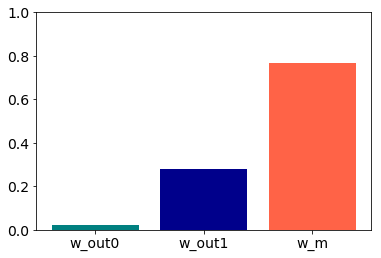

24it [00:00, 119.49it/s]

>> sig_rec: 0.10
M norm: 1.20	 M angle: 0.50, 3 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.20	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.73	 w_out vs. w_m angle: 0.26

500it [00:04, 121.59it/s]
1500it [00:17, 87.30it/s]
500it [00:04, 121.65it/s]


AR early fit 0.953, late fit 0.972


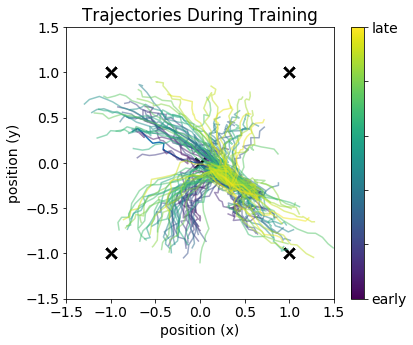

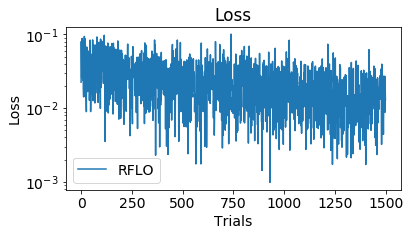

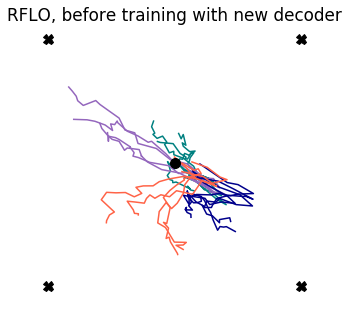

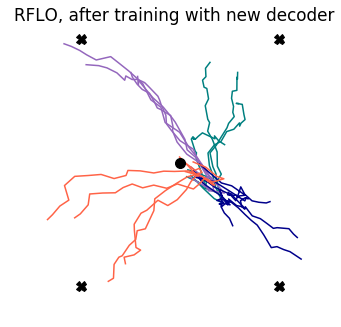

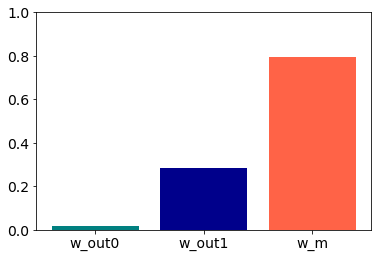

12it [00:00, 117.03it/s]

>> sig_rec: 0.25
M norm: 1.20	 M angle: 0.50, 3 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.20	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.73	 w_out vs. w_m angle: 0.26

500it [00:04, 121.62it/s]
1500it [00:17, 83.60it/s]
500it [00:05, 88.13it/s]


AR early fit 0.928, late fit 0.948


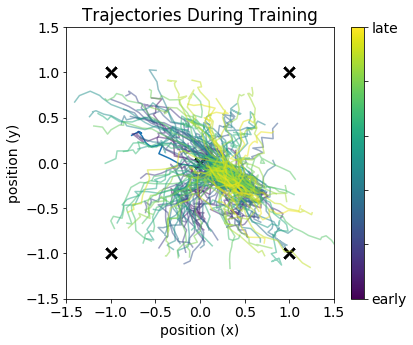

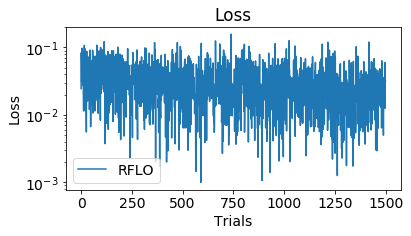

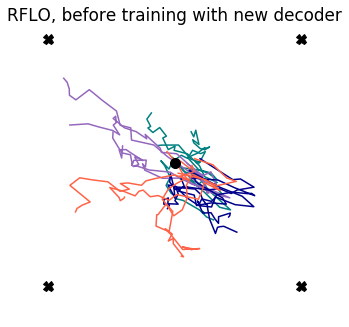

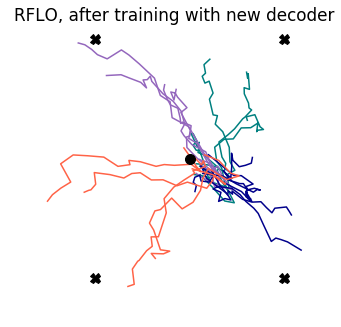

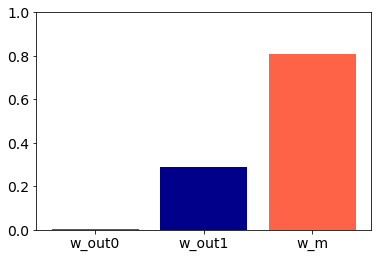

10it [00:00, 90.52it/s]

>> sig_rec: 0.50
M norm: 1.20	 M angle: 0.50, 3 iterations
w_out1 norm: 1.52	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.20	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.73	 w_out vs. w_m angle: 0.26

500it [00:05, 94.77it/s] 
1500it [00:16, 90.46it/s]
500it [00:03, 127.92it/s]


AR early fit 0.905, late fit 0.920


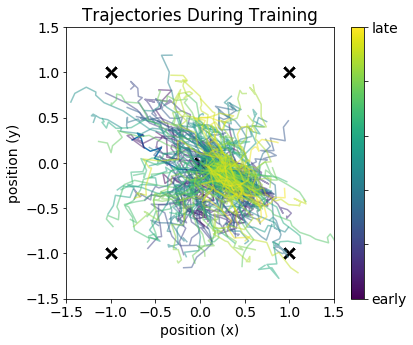

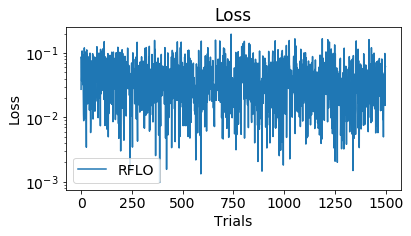

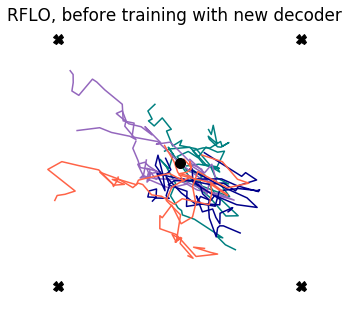

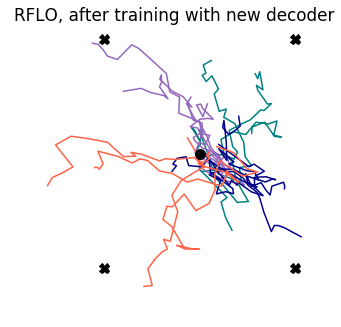

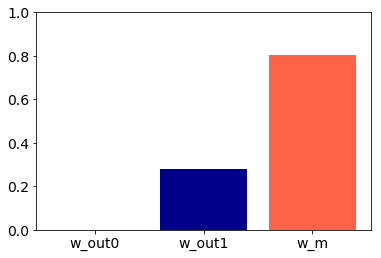

6it [00:00, 56.63it/s]

>> sig_rec: 0.01
M norm: 1.11	 M angle: 0.49, 5 iterations
w_out1 norm: 1.49	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.11	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.77	 w_out vs. w_m angle: 0.19

500it [00:04, 101.09it/s]
1500it [00:20, 72.27it/s]
500it [00:05, 88.84it/s]


AR early fit 0.979, late fit 0.989


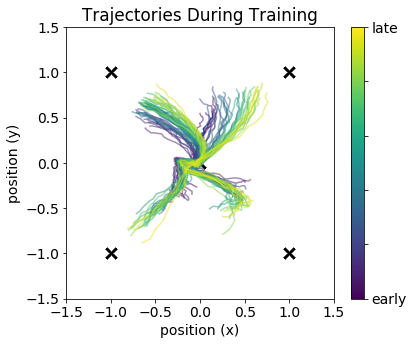

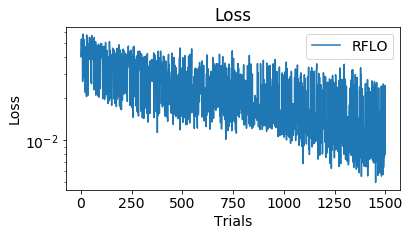

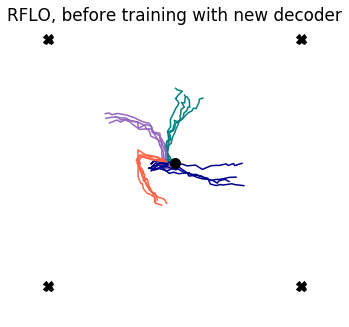

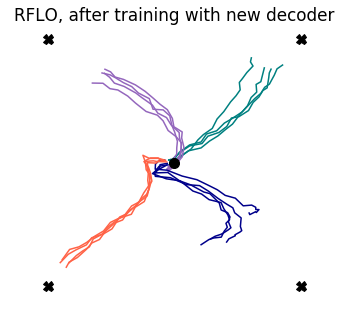

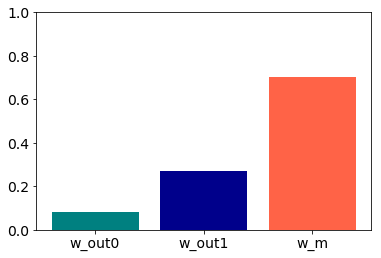

5it [00:00, 46.06it/s]

>> sig_rec: 0.05
M norm: 1.11	 M angle: 0.49, 5 iterations
w_out1 norm: 1.49	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.11	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.77	 w_out vs. w_m angle: 0.19

500it [00:05, 83.69it/s]
1500it [00:24, 61.80it/s]
500it [00:06, 74.85it/s]


AR early fit 0.965, late fit 0.981


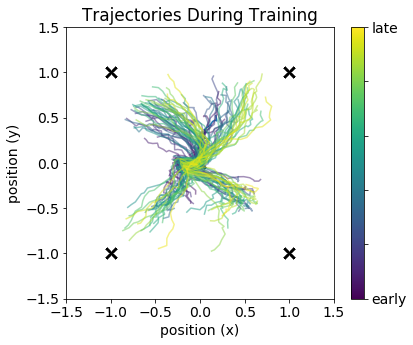

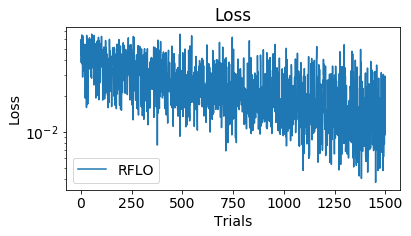

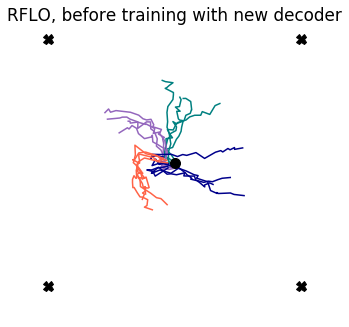

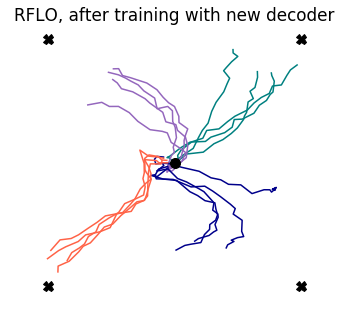

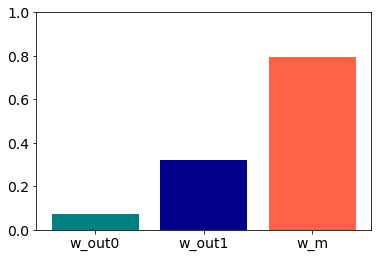

4it [00:00, 38.44it/s]

>> sig_rec: 0.10
M norm: 1.11	 M angle: 0.49, 5 iterations
w_out1 norm: 1.49	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.11	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.77	 w_out vs. w_m angle: 0.19

500it [00:06, 72.21it/s]
1500it [00:30, 59.99it/s]
500it [00:06, 73.62it/s]


AR early fit 0.953, late fit 0.973


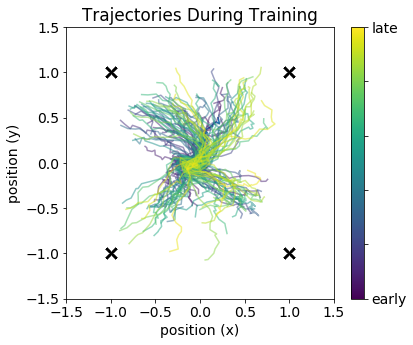

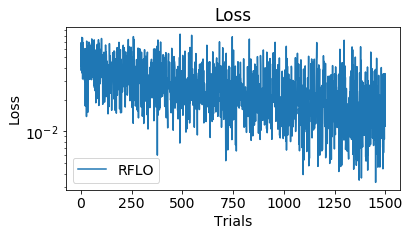

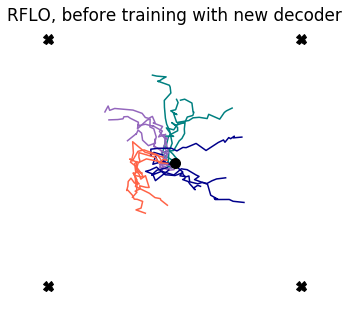

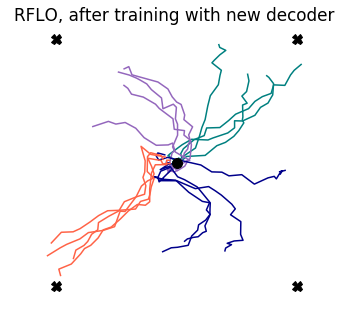

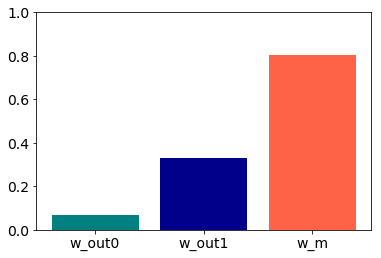

3it [00:00, 29.77it/s]

>> sig_rec: 0.25
M norm: 1.11	 M angle: 0.49, 5 iterations
w_out1 norm: 1.49	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.11	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.77	 w_out vs. w_m angle: 0.19

500it [00:06, 80.07it/s]
1500it [00:23, 63.45it/s]
500it [00:06, 75.15it/s]


AR early fit 0.928, late fit 0.952


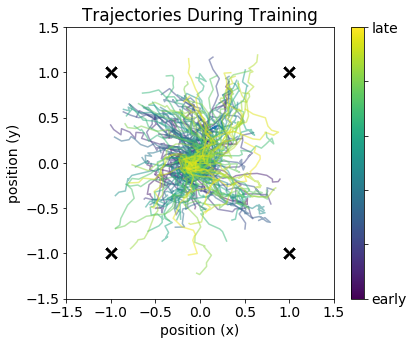

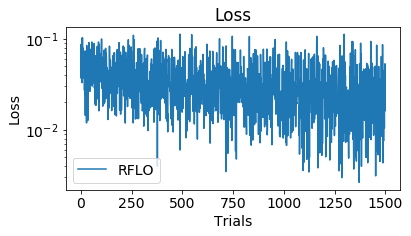

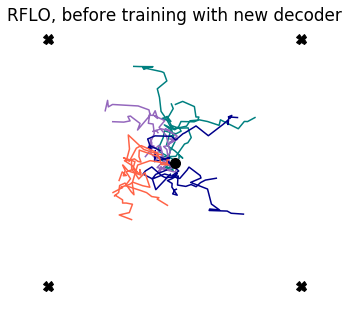

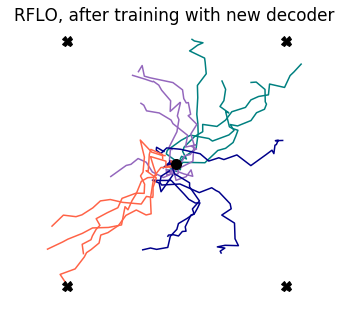

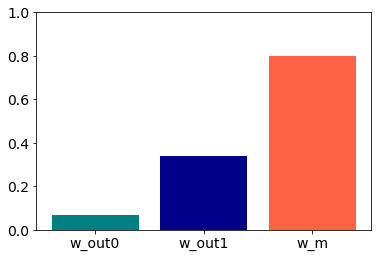

4it [00:00, 36.96it/s]

>> sig_rec: 0.50
M norm: 1.11	 M angle: 0.49, 5 iterations
w_out1 norm: 1.49	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.11	 w_out1 vs. w_m angle: 0.49
w_m norm: 1.77	 w_out vs. w_m angle: 0.19

500it [00:06, 75.71it/s]
1500it [00:24, 60.24it/s]
500it [00:06, 79.59it/s]


AR early fit 0.906, late fit 0.926


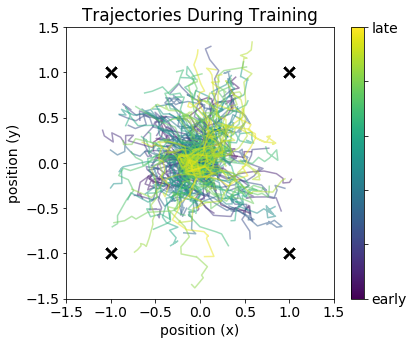

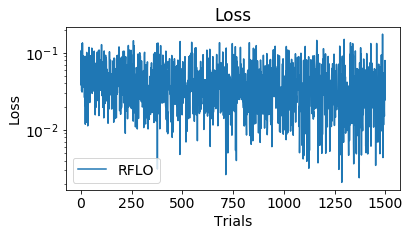

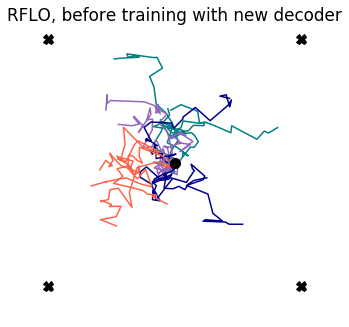

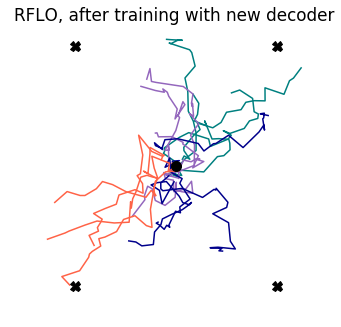

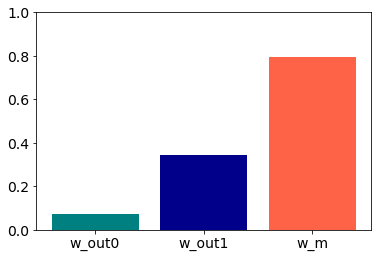

4it [00:00, 38.86it/s]

>> sig_rec: 0.01
M norm: 1.17	 M angle: 0.51, 68 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.17	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.77	 w_out vs. w_m angle: 0.20

500it [00:06, 73.16it/s]
1500it [00:25, 58.06it/s]
500it [00:04, 116.28it/s]


AR early fit 0.979, late fit 0.989


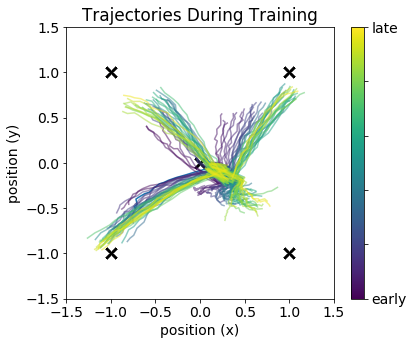

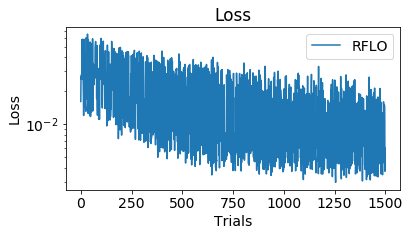

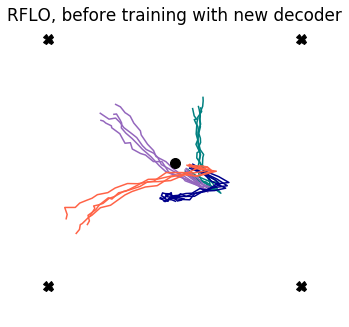

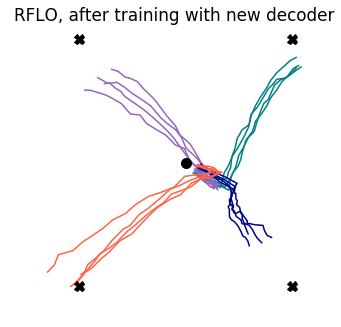

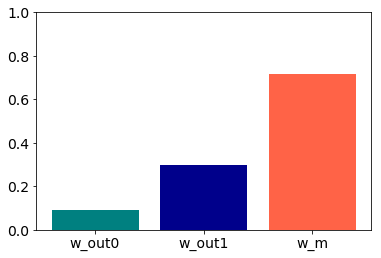

5it [00:00, 39.88it/s]

>> sig_rec: 0.05
M norm: 1.17	 M angle: 0.51, 68 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.17	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.77	 w_out vs. w_m angle: 0.20

500it [00:04, 105.42it/s]
1500it [00:17, 84.19it/s]
500it [00:04, 115.72it/s]


AR early fit 0.965, late fit 0.980


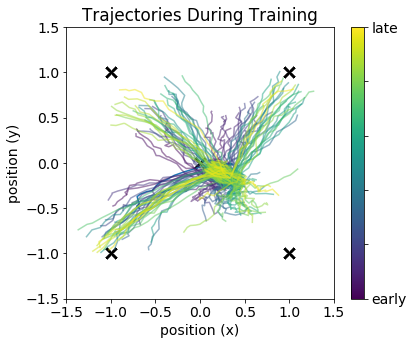

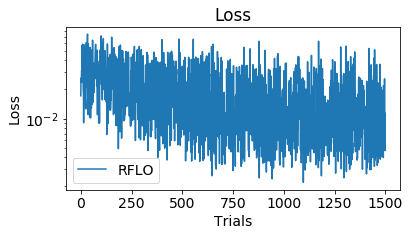

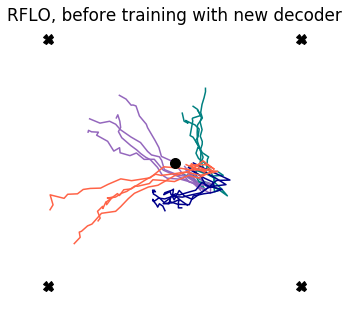

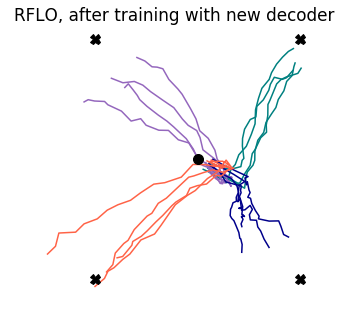

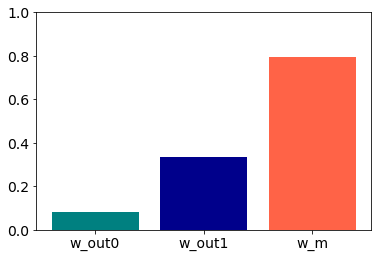

6it [00:00, 46.50it/s]

>> sig_rec: 0.10
M norm: 1.17	 M angle: 0.51, 68 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.17	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.77	 w_out vs. w_m angle: 0.20

500it [00:06, 82.91it/s]
1500it [00:21, 70.01it/s]
500it [00:06, 82.35it/s]


AR early fit 0.953, late fit 0.970


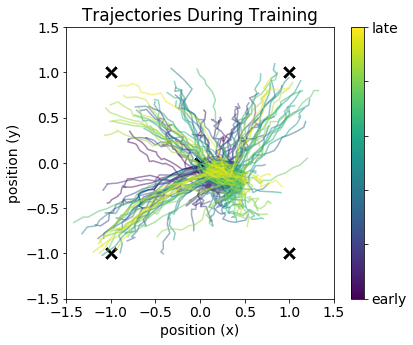

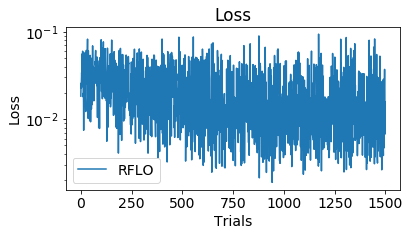

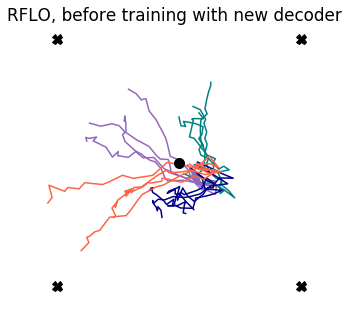

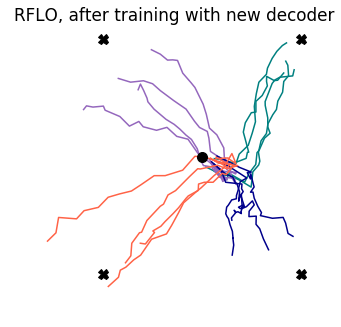

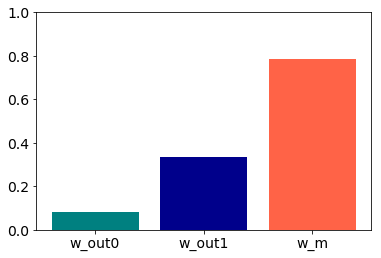

6it [00:00, 52.10it/s]

>> sig_rec: 0.25
M norm: 1.17	 M angle: 0.51, 68 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.17	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.77	 w_out vs. w_m angle: 0.20

500it [00:05, 87.93it/s]
1500it [00:26, 56.26it/s]
500it [00:16, 38.56it/s]


AR early fit 0.927, late fit 0.945


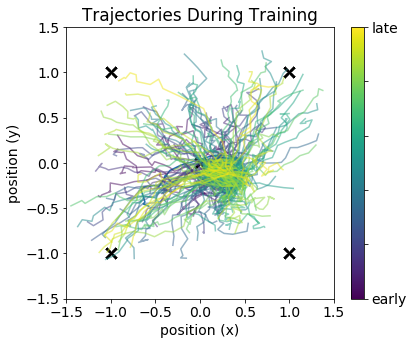

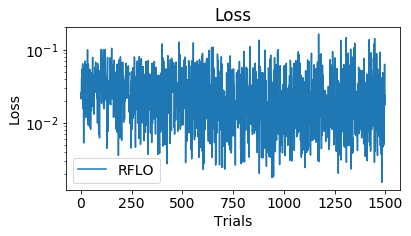

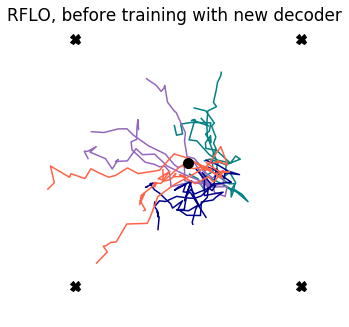

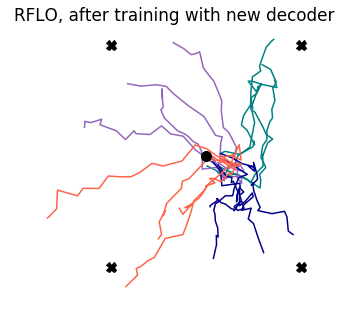

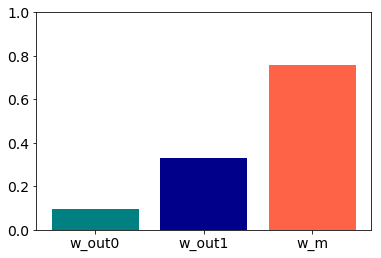

>> sig_rec: 0.50
M norm: 1.17	 M angle: 0.51, 68 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.17	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.77	 w_out vs. w_m angle: 0.20

500it [00:08, 62.02it/s]
1500it [00:32, 45.52it/s]
500it [00:07, 64.93it/s]


AR early fit 0.904, late fit 0.917


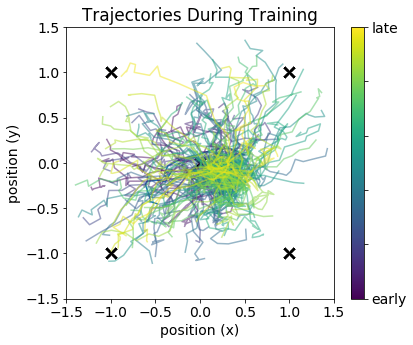

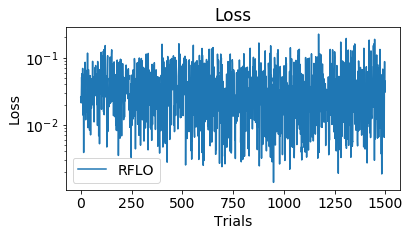

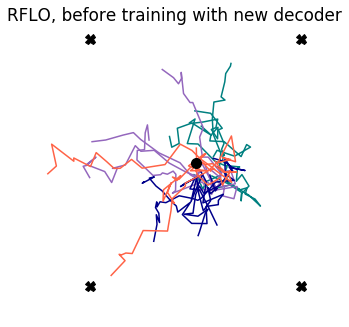

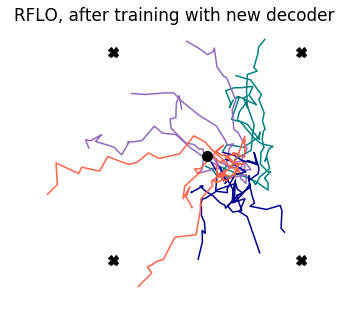

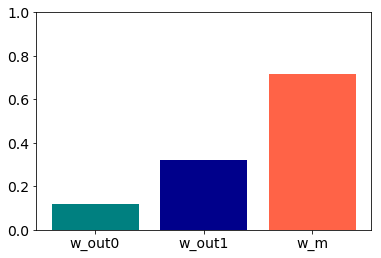

>> sig_rec: 0.01
NO OVERLAP M angle: 0.62, 98 iterations

0it [00:00, ?it/s]

M norm: 1.20	 M angle: 0.51, 2 iterations
w_out1 norm: 1.51	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.20	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.75	 w_out vs. w_m angle: 0.24

500it [00:07, 77.54it/s]
1500it [00:30, 49.80it/s]
500it [00:07, 66.57it/s]


AR early fit 0.979, late fit 0.990


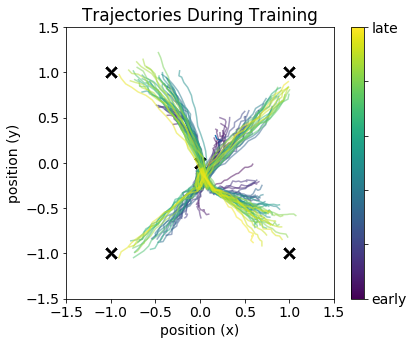

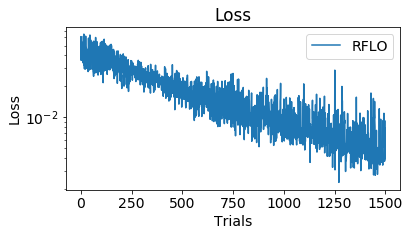

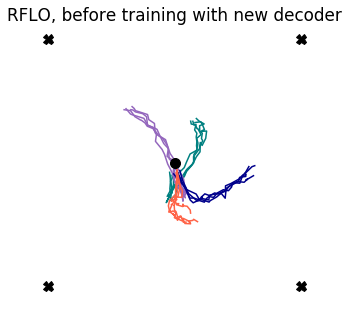

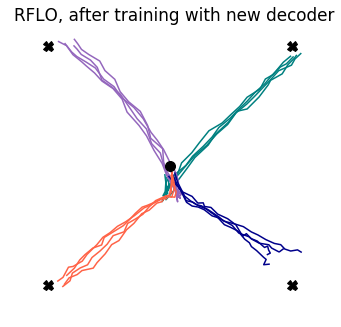

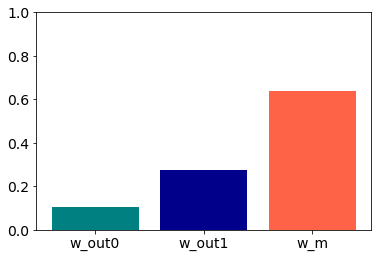

0it [00:00, ?it/s]

>> sig_rec: 0.05
M norm: 1.20	 M angle: 0.51, 2 iterations
w_out1 norm: 1.51	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.20	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.75	 w_out vs. w_m angle: 0.24

500it [00:07, 68.91it/s]
1500it [00:30, 50.18it/s]
500it [00:11, 44.20it/s]


AR early fit 0.965, late fit 0.983


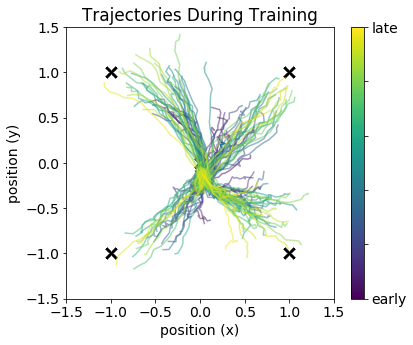

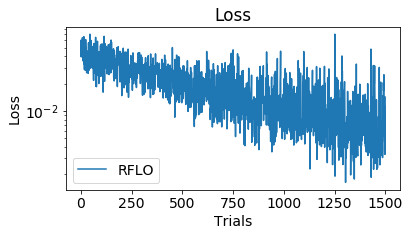

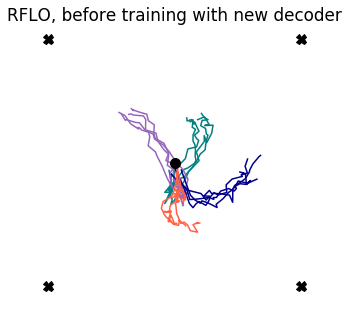

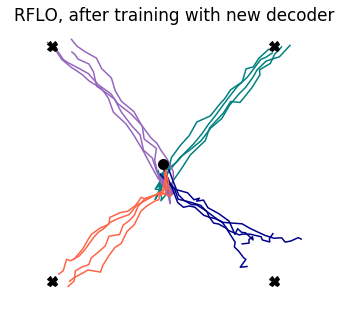

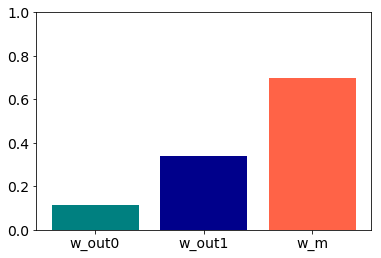

>> sig_rec: 0.10
NO OVERLAP M angle: 0.59, 190 iterations

0it [00:00, ?it/s]

M norm: 1.20	 M angle: 0.51, 2 iterations
w_out1 norm: 1.51	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.20	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.75	 w_out vs. w_m angle: 0.24

500it [00:20, 21.20it/s]
1500it [00:34, 43.67it/s]
500it [00:08, 76.11it/s]


AR early fit 0.953, late fit 0.975


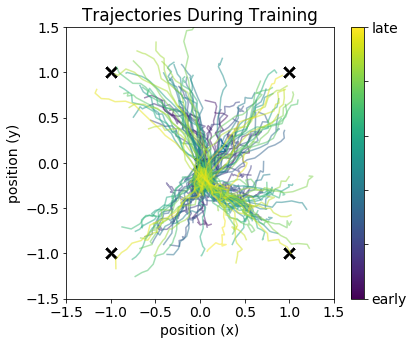

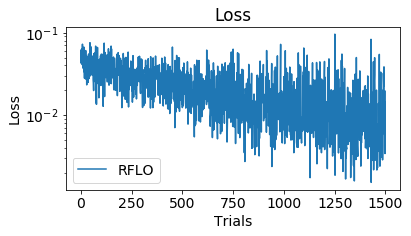

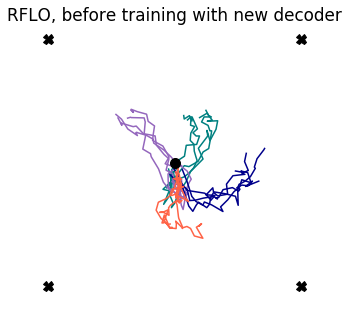

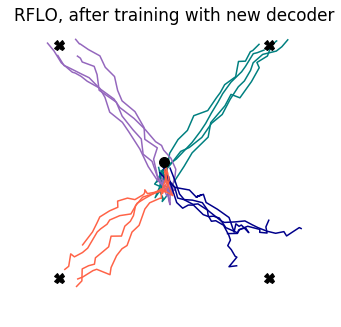

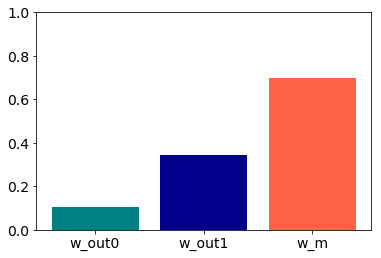

0it [00:00, ?it/s]

>> sig_rec: 0.25
M norm: 1.20	 M angle: 0.51, 2 iterations
w_out1 norm: 1.51	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.20	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.75	 w_out vs. w_m angle: 0.24

500it [00:08, 57.54it/s]
1500it [00:31, 47.16it/s]
500it [00:06, 75.35it/s]


AR early fit 0.928, late fit 0.955


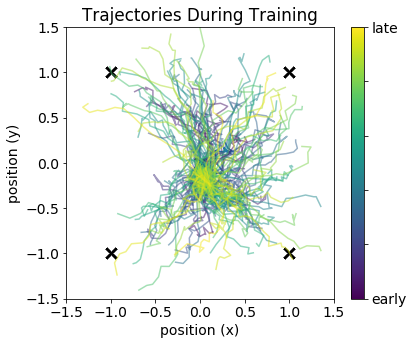

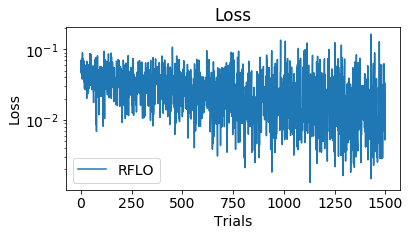

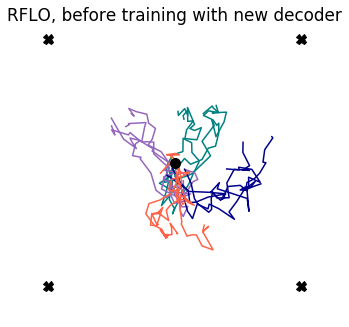

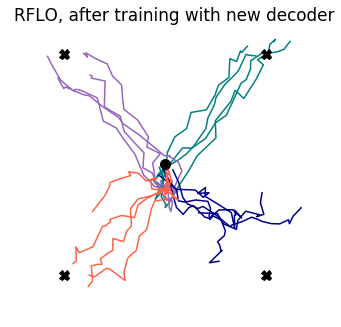

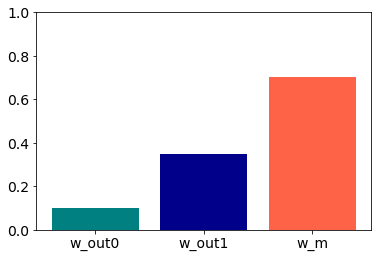

5it [00:00, 47.27it/s]

>> sig_rec: 0.50
M norm: 1.20	 M angle: 0.51, 2 iterations
w_out1 norm: 1.51	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.20	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.75	 w_out vs. w_m angle: 0.24

500it [00:06, 76.41it/s]
1500it [00:25, 58.78it/s]
500it [00:06, 76.90it/s]


AR early fit 0.905, late fit 0.929


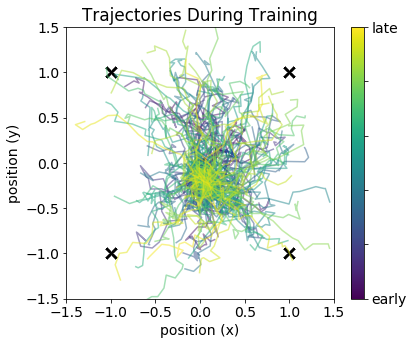

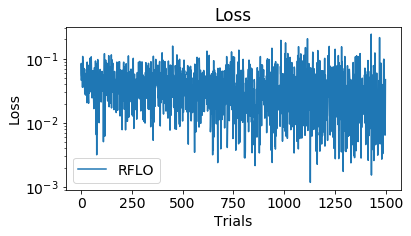

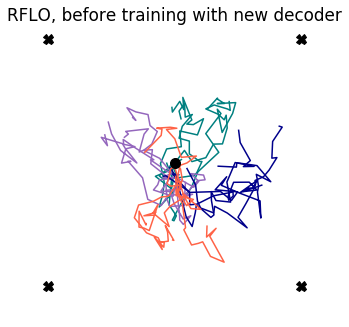

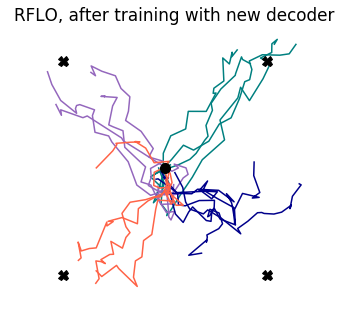

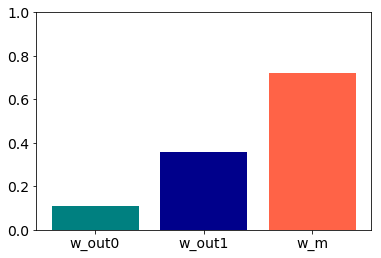

In [5]:
rnn_seed = 72
pretrain_duration = 2500
train_duration = 1500
test_duration = 500


# Set RNN Parameters
params = RNNparams(n_in=4,n_rec=50,n_out=2,tau_rec=10,
               eta_in=0.1,eta_rec=0.1,eta_out=0.1,
               sig_in=0.0,sig_rec=0.25,sig_out=0.01,
               velocity_transform=False, tau_vel = 0.8, dt_vel = 0.1,
               rng=np.random.RandomState(rnn_seed))
params.print_params()



# Initialize RNN
net0 = RNN(params)
print('>>net0, not linear')
sim0 = Simulation(net0)
rflo = RFLO(net0,apply_to=['w_rec'],online=False)
sim0.run_session(n_trials=pretrain_duration, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=20)

fig0 = plot_trained_trajectories(sim=sim0, tasks=[task1,task2,task3,task4],title='Pretrain RFLO, train '+r'$W_{rec}$')






""" Average over multiple seeds """
seeds = [0,1,2,3,4,5]#,22,33,47]
overlaps = [0.5]
n_changes = [50]
overlap_w_out0 = 0.5
n_change_w_out0 = 50

noise = [0.01,0.05,0.1,0.25,0.5]


stats = {}
stats['corr1'] = []
stats['corr2'] = []
stats['corr3'] = []
stats['corrcoef'] = []

stats['seeds'] = seeds
stats['overlaps'] = overlaps
stats['n_changes'] = n_changes
stats['overlap_w_out0'] = overlap_w_out0
stats['n_change_w_out0'] = n_change_w_out0
stats['frac_on'] = frac_on
stats['RNNparams'] = params
stats['pretrain_duration'] = pretrain_duration
stats['train_duration'] = train_duration
stats['test_duration'] = test_duration
stats['rnn_seed'] = rnn_seed
stats['comments'] = 'vary overlap between M and w_out1'

for seed in seeds:

    corr1_list = []
    corr2_list = []
    corr3_list = []
    corrcoef_list = []
    

    #for overlap,n_change in zip(overlaps,n_changes):
    overlap = overlaps[0]
    n_change = n_changes[0]
    for sig_rec in noise:
        
        
        # Set RNN Parameters
        params_sigrec = RNNparams(n_in=4,n_rec=50,n_out=2,tau_rec=10,
               eta_in=0.1,eta_rec=0.1,eta_out=0.1,
               sig_in=0.0,sig_rec=sig_rec,sig_out=0.01,
               velocity_transform=False, tau_vel = 0.8, dt_vel = 0.1,
               rng=np.random.RandomState(rnn_seed)) # this seed doesn't matter
        
        print('>> sig_rec: {:.2f}'.format(sig_rec))
        
        """ let overlap between w_out0 and w_out1 be constant """
        w_out1 = choose_aligned_matrix(net0.w_out.copy(),n_change=n_change_w_out0,overlap=overlap_w_out0,rng=np.random.RandomState(seed),zero=False,tolerance=0.01,loop=1000)
        """ change overlap between w_out1 and w_m  """
        w_m = choose_aligned_matrix(w_out1,n_change=n_change,overlap=overlap,rng=np.random.RandomState(seed),zero=False,tolerance=0.01,loop=1000)

        # confirm overlap between w_out1 and w_out
        norm, angle = return_norm_and_angle(net0.w_out,w_out1)
        print('\nw_out1 norm: {:.2f}'.format(norm) + '\t w_out vs. w_out1 angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out1 and w_m
        norm, angle = return_norm_and_angle(w_out1,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out1 vs. w_m angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out and w_m
        norm, angle = return_norm_and_angle(net0.w_out,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out vs. w_m angle: {:.2f}'.format(angle),end='')
        
        
        
        
        net1_pre = RNN(params_sigrec)
        net1_pre.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy())
        net1_pre.set_weights(w_out = w_out1)
        net1_pre.set_weights(w_m = w_m.T)

        # unfortunately I need to make a different network to maintain integrity of pre and post simulations for plotting
        net1 = RNN(params_sigrec)
        net1.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy())
        net1.set_weights(w_out = w_out1)
        net1.set_weights(w_m = w_m.T)




        """ Track activity with new decoder, before training """

        sim1_pre = Simulation(net1_pre)
        trackvars = TrackVars(net1_pre,apply_to=[]) 
        sim1_pre.run_session(n_trials=test_duration, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)
        #fig = plot_trained_trajectories(sim=sim1_pre, tasks=[task1,task2,task3,task4],title='RFLO, before training with new decoder')

        """ Train with new decoder """

        sim1_train = Simulation(net1)
        rflo = RFLO(net1,apply_to=['w_rec'],online=False)
        sim1_train.run_session(n_trials=train_duration, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['h','loss','err'], plot=True, plot_freq=10)

        """ Track activity with new decoder, after training """
        net1_post = RNN(params_sigrec)
        net1_post.set_weights(w_in=net1.w_in.copy(), w_rec=net1.w_rec.copy())
        net1_post.set_weights(w_out = net1.w_out)
        net1_post.set_weights(w_m = net1.w_m)

        sim1_post = Simulation(net1_post)
        trackvars = TrackVars(net1_post,apply_to=[]) 
        sim1_post.run_session(n_trials=test_duration, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)

        
        fig = plot_trained_trajectories(sim=sim1_pre, tasks=[task1,task2,task3,task4],title='RFLO, before training with new decoder')

        fig = plot_trained_trajectories(sim=sim1_post, tasks=[task1,task2,task3,task4],title='RFLO, after training with new decoder')
        
        
        """ Calculate F fields """
        F_early, score_early = flow_field_data(sim1_pre.session_probes['h'])
        F_late, score_late = flow_field_data(sim1_post.session_probes['h'])

        print('AR early fit {:.3f}, late fit {:.3f}'.format(score_early,score_late))

        Fdata = F_late - F_early

        # separate train and test data from sim1_train
        n_total = len(sim1_train.session_probes['h'])
        n_train = int(0.5 * n_total)
        idx_train = np.random.RandomState(1975+seed).choice(np.arange(0,n_total),size=n_train,replace=False).astype(int)
        idx_test = np.arange(0,n_total)[~idx_train].astype(int)
        #idx_test=idx_train

        h_train = np.asarray(sim1_train.session_probes['h'])[idx_train,:,:,:]
        err_train = np.asarray(sim1_train.session_probes['err'])[idx_train,:,:,:]

        Fpred_w_out = flow_field_predicted(net0.w_out,err_train,h_train)
        Fpred_w_out1 = flow_field_predicted(w_out1,err_train,h_train)
        Fpred_w_m = flow_field_predicted(w_m,err_train,h_train)

        h_test = np.asarray(sim1_train.session_probes['h'])[idx_test,:,:,:]

        corr1 = calculate_flow_field_correlation(Fpred_w_out,Fdata,h_test) # could also sample sim_test
        corr1_list.append(corr1)

        corr2 = calculate_flow_field_correlation(Fpred_w_out1,Fdata,h_test) # could also sample sim_test
        corr2_list.append(corr2)

        corr3 = calculate_flow_field_correlation(Fpred_w_m,Fdata,h_test) # could also sample sim_test
        corr3_list.append(corr3)
        
        fig,ax = plt.subplots(1,1)
        plt.bar([0,1,2],[corr1,corr2,corr3],tick_label=['w_out0','w_out1','w_m'],color=['teal','darkblue','tomato'])
        plt.ylim([0,1])
        plt.show()
        
        
        
        
        
        
    # update
    stats['corr1'].append(corr1_list)
    stats['corr2'].append(corr2_list)
    stats['corr3'].append(corr3_list)
    #stats['corrcoef'].append(corrcoef_list)



In [10]:
""" save dict with unique name """
stats_sig_rec = stats

""" save dict """

save = True
tag = 'sup-5-24-v2'


if save:
    
    with open(folder+'stats_sig_rec-'+tag+'.pickle', 'wb') as handle:
        pickle.dump(stats_sig_rec, handle, protocol=pickle.HIGHEST_PROTOCOL)
        
    print('\nsaved as '+folder+'stats_sig_rec-'+tag+'.pickle')



saved as figs-2022-5-24/stats_sig_rec-sup-5-24-v2.pickle


In [8]:
""" Load RFLO version for same hyperparameters """

filename='../NeurIPS-2022-5-16/figs-2022-5-18/stats_rflo_m-fig2b-5-18.pickle'

with open(filename, 'rb') as fp:
    stats_rflo_m = pickle.load(fp)

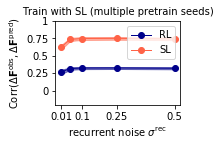

In [9]:
""" Same plot using flow field """
paper = True
save = True

fig,ax = plt.subplots(1,1,figsize=(6,4))

# """ Baseline Result from Main Figure """
# n_samples = len(stats_rflo_m['corr1'])
# mn1 = np.mean(np.asarray(stats_rflo_m['corr1']),axis=0)
# std1 = np.std(np.asarray(stats_rflo_m['corr1']),axis=0)
# sem1 = std1/np.sqrt(n_samples)


""" vary_sig_rec """
n_samples = len(stats_sig_rec['corr2'])
mn2 = np.mean(np.asarray(stats_sig_rec['corr2']),axis=0)
std2 = np.std(np.asarray(stats_sig_rec['corr2']),axis=0)
sem2 = std2/np.sqrt(n_samples)

mn3 = np.mean(np.asarray(stats_sig_rec['corr3']),axis=0)
std3 = np.std(np.asarray(stats_sig_rec['corr3']),axis=0)
sem3 = std3/np.sqrt(n_samples)


# plt.plot(overlaps,mn1,'o-',linewidth=1,label=r'$W^{bmi0}$',color='teal')
# plt.fill_between(overlaps,mn1-sem1,mn1+sem1,alpha=0.5,color='teal')

plt.plot(noise,mn2,'o-',linewidth=1,label='RL',color='darkblue')
plt.fill_between(noise,mn2-sem2,mn2+sem2,alpha=0.5,color='darkblue')

plt.plot(noise,mn3,'o-',linewidth=1,label='SL',color='tomato')
plt.fill_between(noise,mn3-sem3,mn3+sem3,alpha=0.5,color='tomato')


plt.ylim([-0.2,1])
plt.legend()
plt.title('Train with SL (multiple pretrain seeds)')
plt.xlabel('recurrent noise '+r'$\sigma^{\mathrm{rec}}$')
plt.ylabel('Corr'+r'$(\Delta \mathbf{F}^{\mathrm{obs}}, \Delta \mathbf{F}^{\mathrm{pred}})$')

plt.tight_layout()

if paper:
    fig,ax = paper_format(fig=fig,ax=ax,xlabels=[0.01,0.1,0.25,0.5],ylabels=[0,0.25,0.5,0.75,1],ticksize=10,linewidth=2,ylim=[-.2,1],figsize=(2.25,3))

plt.show()

if save:
    if paper:
        fig.savefig(folder+'sup-sig-rec-v2.pdf')
    else:
        fig.savefig(folder+'sup-sig-rec-v2.pdf')


# Same thing, but pretrain with different seeds

6it [00:00, 57.41it/s]

n_in: 4
n_rec: 50
n_out: 2
sig_in: 0.0
sig_rec: 0.25
sig_out: 0.01
tau_rec: 10
dt: 1.0
eta_in: 0.1
eta_rec: 0.1
eta_out: 0.1
g_in: 2.0
g_rec: 1.5
g_out: 2.0
g_fb: 2.0
driving_feedback: False
eta_fb: None
sig_fb: None
feedback_signal: position
velocity_transform: False
tau_vel: 0.8
dt_vel: 0.1
sig_rec_dim: None
eta_m: None
sig_m: None
lam_m: None
rng: <mtrand.RandomState object at 0x7fbc12d18ab0>
>>net0, not linear


2500it [00:27, 93.93it/s]
10it [00:00, 92.91it/s]

>> sig_rec: 0.01
M norm: 1.16	 M angle: 0.50, 24 iterations
w_out1 norm: 1.45	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.16	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.73	 w_out vs. w_m angle: 0.20

500it [00:04, 111.88it/s]
1500it [00:20, 73.07it/s]
500it [00:22, 22.30it/s]


AR early fit 0.980, late fit 0.990


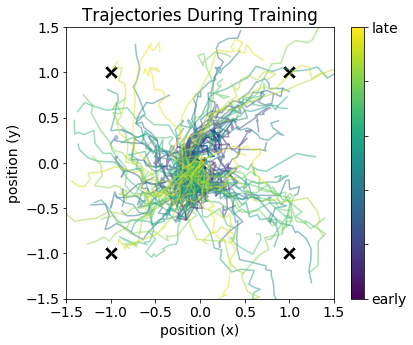

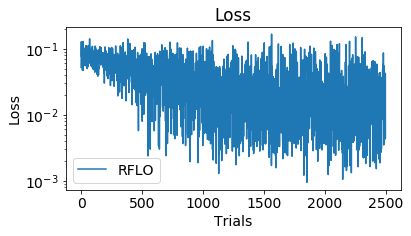

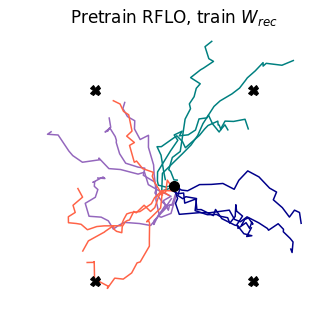

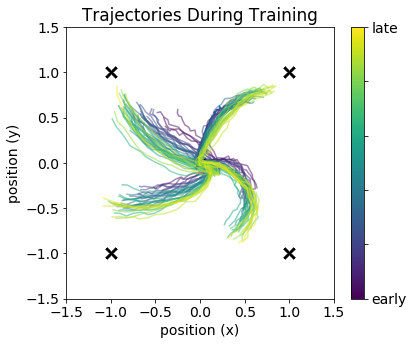

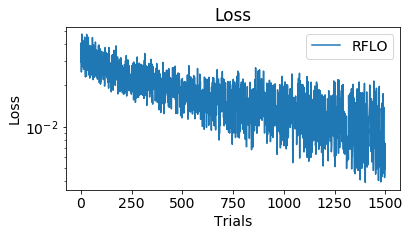

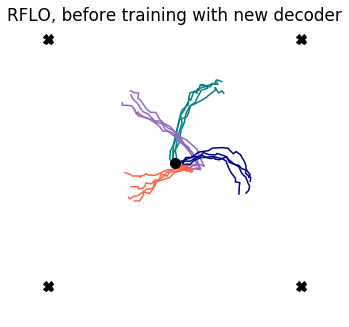

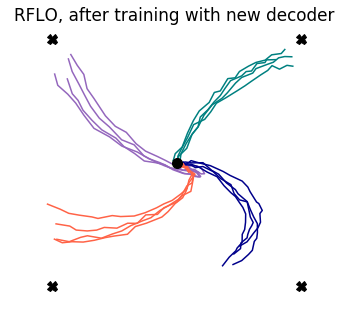

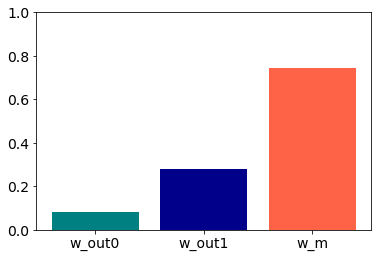

9it [00:00, 88.96it/s]

>> sig_rec: 0.05
M norm: 1.16	 M angle: 0.50, 24 iterations
w_out1 norm: 1.45	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.16	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.73	 w_out vs. w_m angle: 0.20

500it [00:04, 115.12it/s]
1500it [00:16, 92.11it/s]
500it [00:04, 122.15it/s]


AR early fit 0.966, late fit 0.982


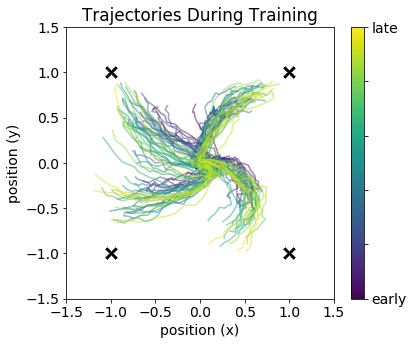

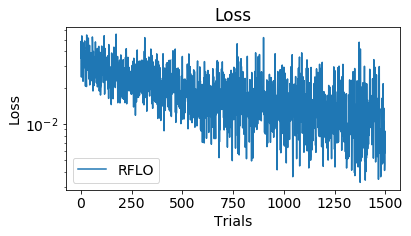

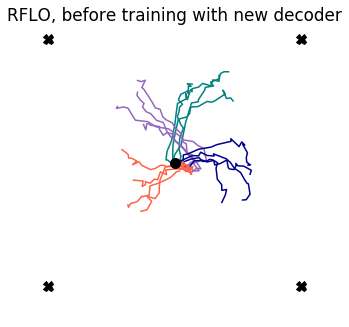

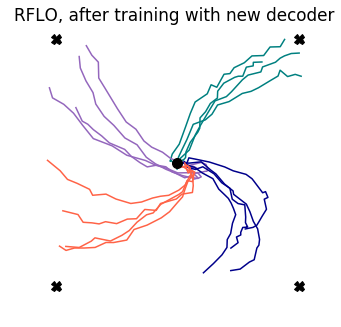

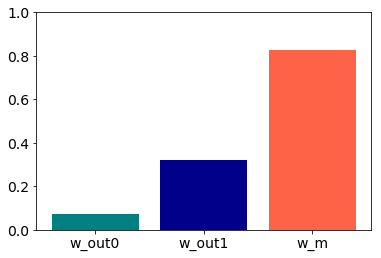

8it [00:00, 77.43it/s]

>> sig_rec: 0.10
M norm: 1.16	 M angle: 0.50, 24 iterations
w_out1 norm: 1.45	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.16	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.73	 w_out vs. w_m angle: 0.20

500it [00:04, 112.47it/s]
1500it [00:17, 86.23it/s]
500it [00:04, 119.43it/s]


AR early fit 0.954, late fit 0.973


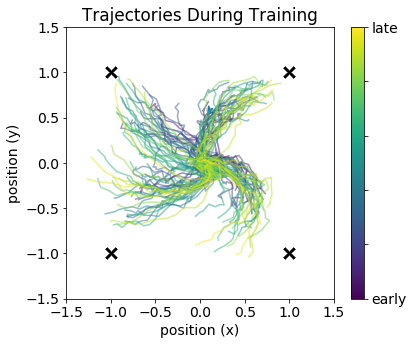

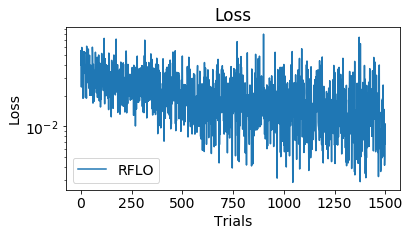

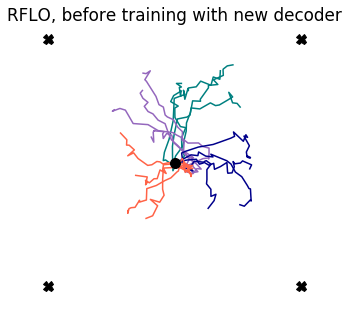

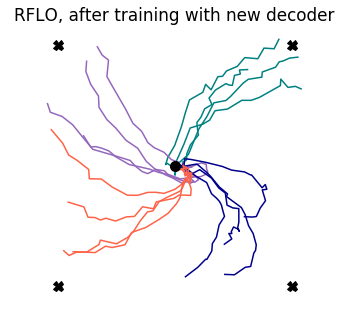

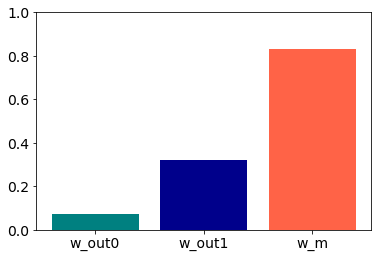

8it [00:00, 79.54it/s]

>> sig_rec: 0.25
M norm: 1.16	 M angle: 0.50, 24 iterations
w_out1 norm: 1.45	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.16	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.73	 w_out vs. w_m angle: 0.20

500it [00:04, 110.86it/s]
1500it [00:17, 87.12it/s]
500it [00:04, 115.32it/s]


AR early fit 0.929, late fit 0.951


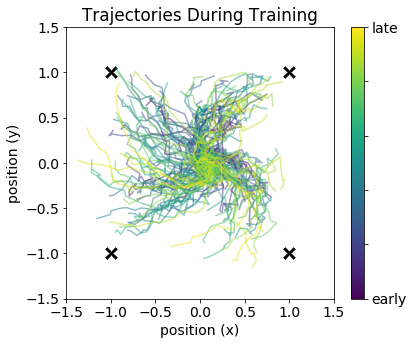

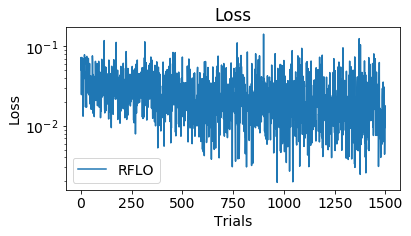

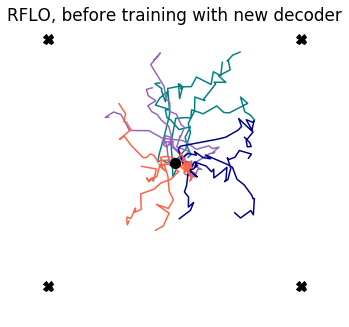

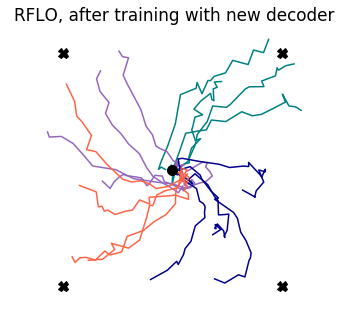

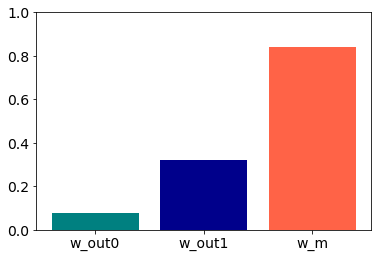

9it [00:00, 88.07it/s]

>> sig_rec: 0.50
M norm: 1.16	 M angle: 0.50, 24 iterations
w_out1 norm: 1.45	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.16	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.73	 w_out vs. w_m angle: 0.20

500it [00:04, 106.88it/s]
1500it [00:17, 84.34it/s]
500it [00:04, 109.44it/s]


AR early fit 0.905, late fit 0.925


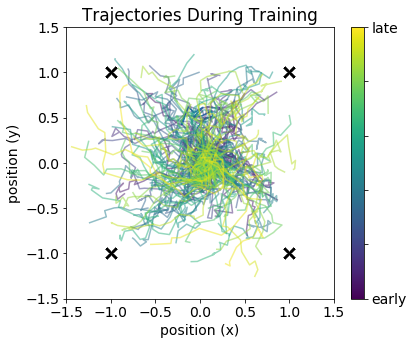

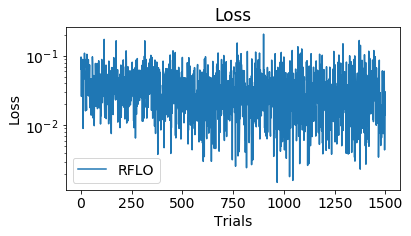

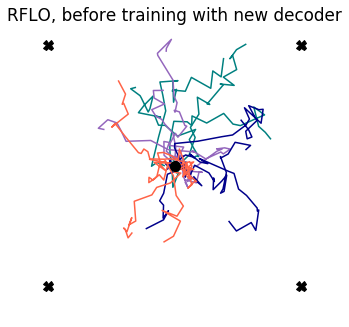

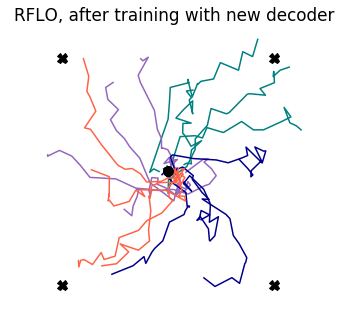

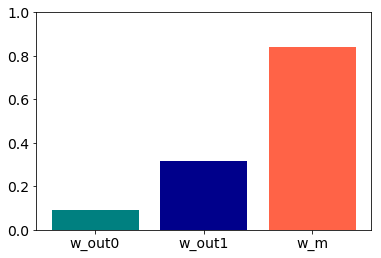

9it [00:00, 86.80it/s]

n_in: 4
n_rec: 50
n_out: 2
sig_in: 0.0
sig_rec: 0.25
sig_out: 0.01
tau_rec: 10
dt: 1.0
eta_in: 0.1
eta_rec: 0.1
eta_out: 0.1
g_in: 2.0
g_rec: 1.5
g_out: 2.0
g_fb: 2.0
driving_feedback: False
eta_fb: None
sig_fb: None
feedback_signal: position
velocity_transform: False
tau_vel: 0.8
dt_vel: 0.1
sig_rec_dim: None
eta_m: None
sig_m: None
lam_m: None
rng: <mtrand.RandomState object at 0x7fbc280c9120>
>>net0, not linear


2500it [00:27, 91.63it/s]
6it [00:00, 51.78it/s]

>> sig_rec: 0.01
M norm: 1.15	 M angle: 0.51, 38 iterations
w_out1 norm: 1.43	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.15	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.66	 w_out vs. w_m angle: 0.27

500it [00:04, 104.41it/s]
1500it [00:17, 87.03it/s]
500it [00:04, 114.80it/s]


AR early fit 0.981, late fit 0.990


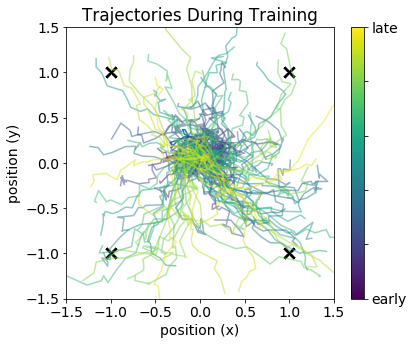

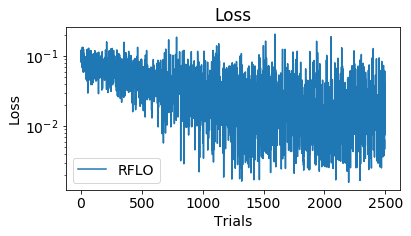

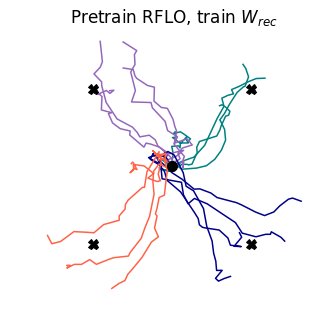

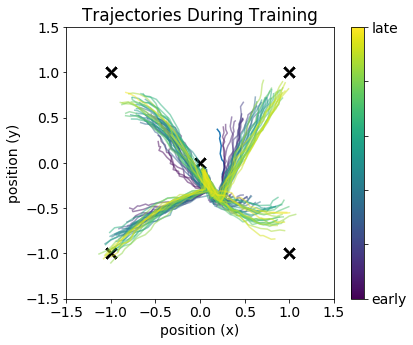

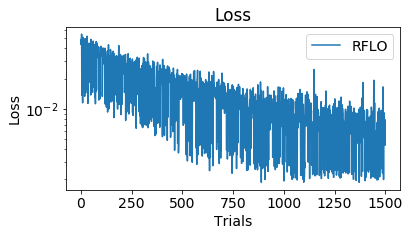

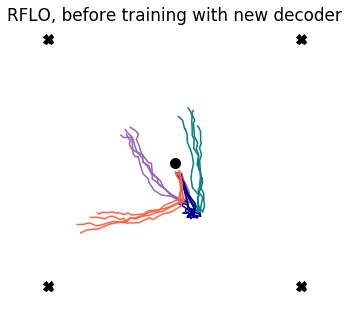

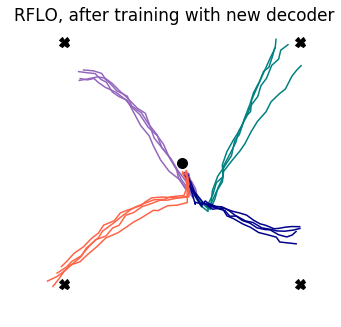

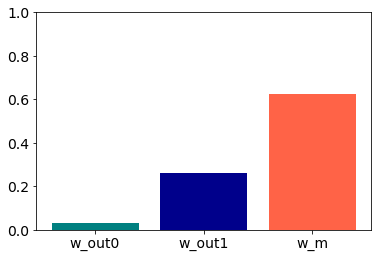

6it [00:00, 57.57it/s]

>> sig_rec: 0.05
M norm: 1.15	 M angle: 0.51, 38 iterations
w_out1 norm: 1.43	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.15	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.66	 w_out vs. w_m angle: 0.27

500it [00:04, 111.93it/s]
1500it [00:19, 75.46it/s]
500it [00:04, 111.28it/s]


AR early fit 0.969, late fit 0.982


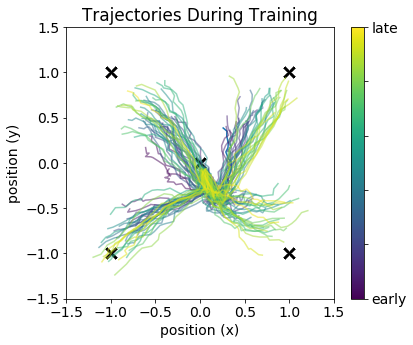

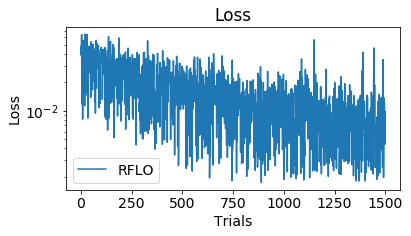

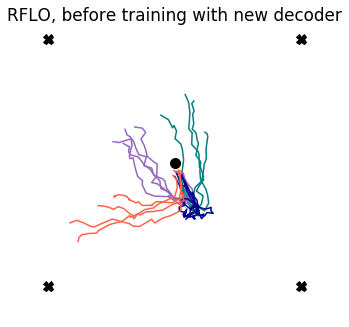

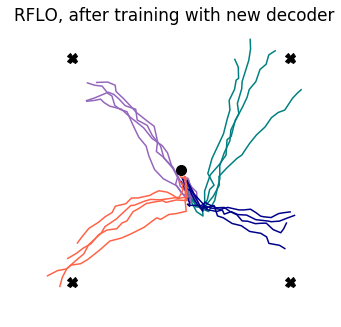

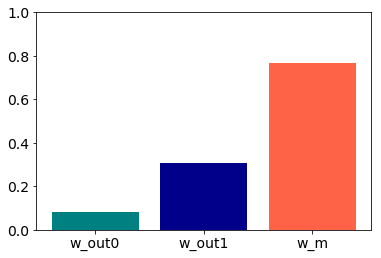

7it [00:00, 63.97it/s]

>> sig_rec: 0.10
M norm: 1.15	 M angle: 0.51, 38 iterations
w_out1 norm: 1.43	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.15	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.66	 w_out vs. w_m angle: 0.27

500it [00:04, 106.51it/s]
1500it [00:17, 87.80it/s]
500it [00:04, 104.41it/s]


AR early fit 0.957, late fit 0.974


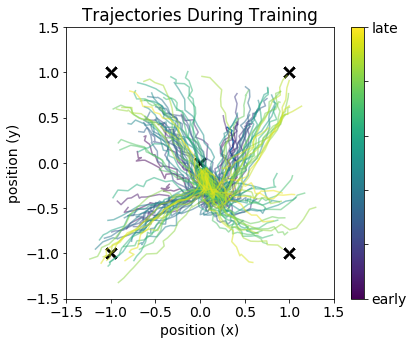

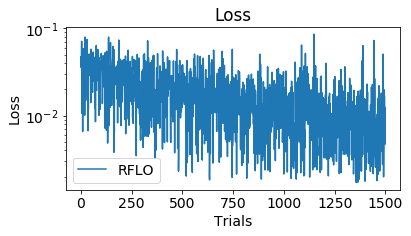

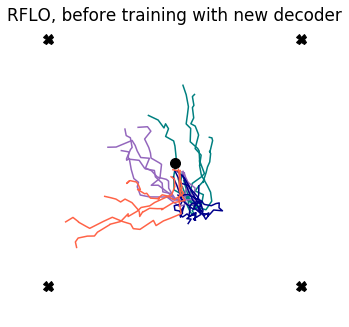

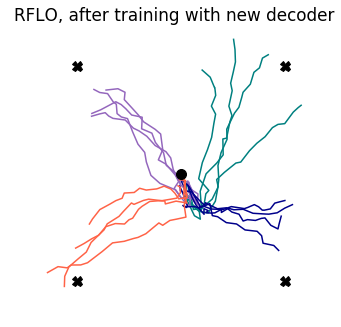

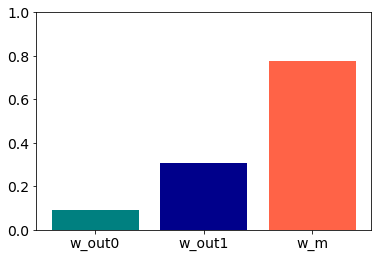

5it [00:00, 46.98it/s]

>> sig_rec: 0.25
M norm: 1.15	 M angle: 0.51, 38 iterations
w_out1 norm: 1.43	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.15	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.66	 w_out vs. w_m angle: 0.27

500it [00:04, 108.81it/s]
1500it [00:16, 89.67it/s]
500it [00:04, 116.71it/s]


AR early fit 0.933, late fit 0.954


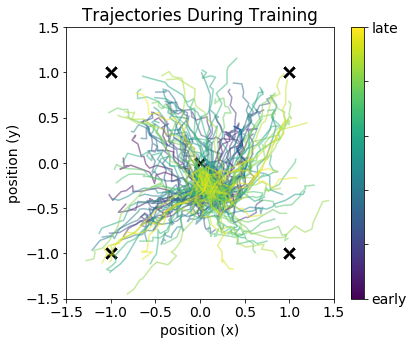

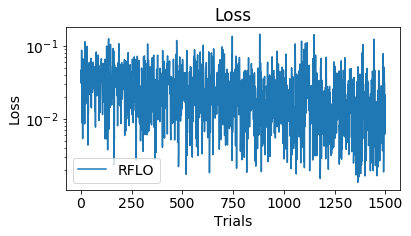

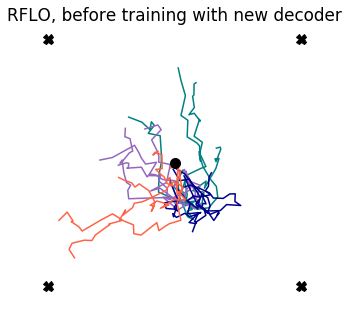

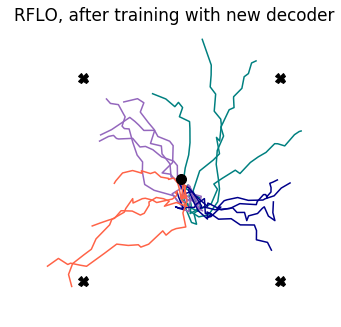

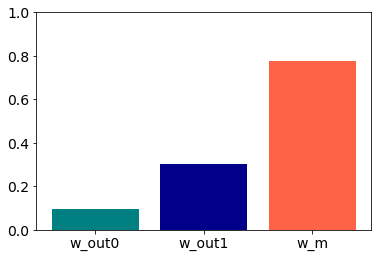

6it [00:00, 54.07it/s]

>> sig_rec: 0.50
M norm: 1.15	 M angle: 0.51, 38 iterations
w_out1 norm: 1.43	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.15	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.66	 w_out vs. w_m angle: 0.27

500it [00:04, 109.50it/s]
1500it [00:20, 73.23it/s]
500it [00:06, 72.60it/s]


AR early fit 0.910, late fit 0.928


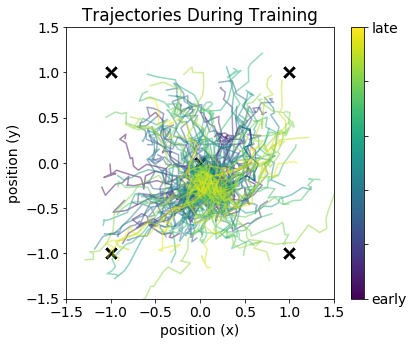

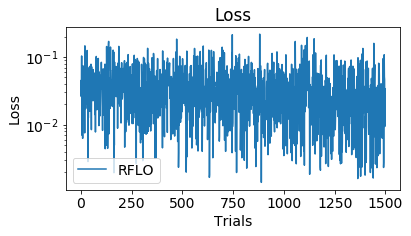

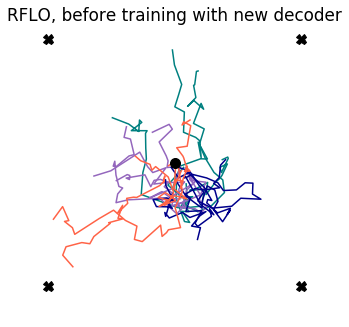

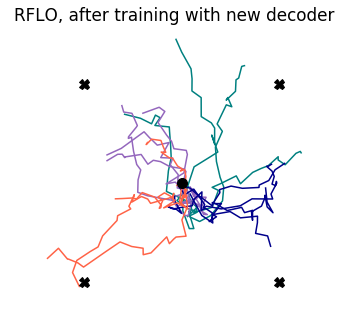

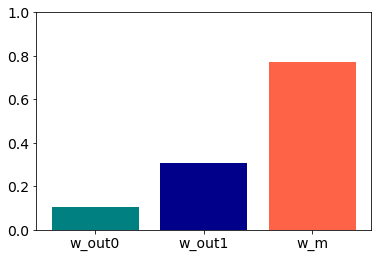

4it [00:00, 39.74it/s]

n_in: 4
n_rec: 50
n_out: 2
sig_in: 0.0
sig_rec: 0.25
sig_out: 0.01
tau_rec: 10
dt: 1.0
eta_in: 0.1
eta_rec: 0.1
eta_out: 0.1
g_in: 2.0
g_rec: 1.5
g_out: 2.0
g_fb: 2.0
driving_feedback: False
eta_fb: None
sig_fb: None
feedback_signal: position
velocity_transform: False
tau_vel: 0.8
dt_vel: 0.1
sig_rec_dim: None
eta_m: None
sig_m: None
lam_m: None
rng: <mtrand.RandomState object at 0x7fbc27cd3b88>
>>net0, not linear


2500it [00:36, 90.33it/s]
11it [00:00, 102.01it/s]

>> sig_rec: 0.01
M norm: 1.18	 M angle: 0.50, 5 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.18	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.65	 w_out vs. w_m angle: 0.32

500it [00:05, 85.44it/s]
1500it [00:30, 46.16it/s]
500it [00:08, 56.45it/s]


AR early fit 0.981, late fit 0.991


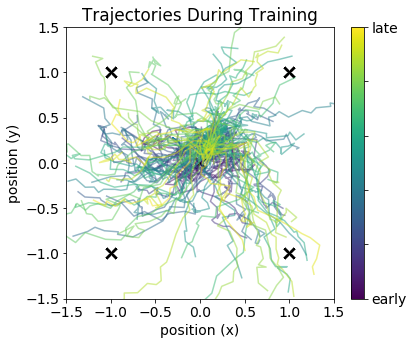

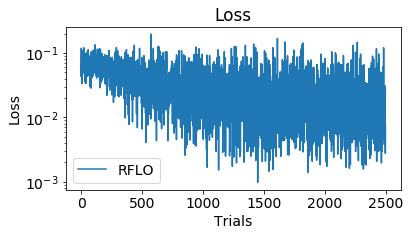

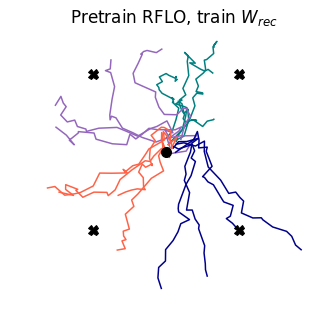

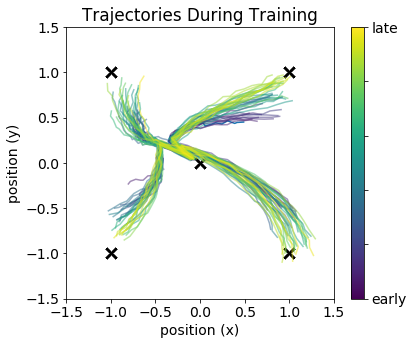

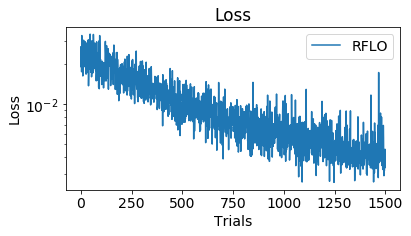

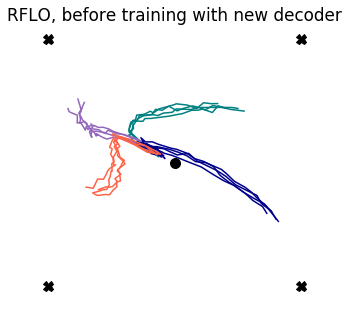

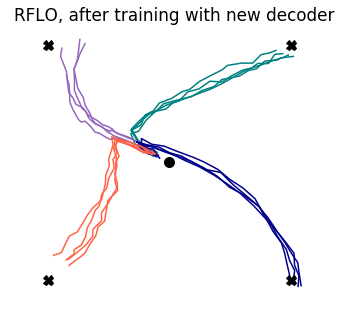

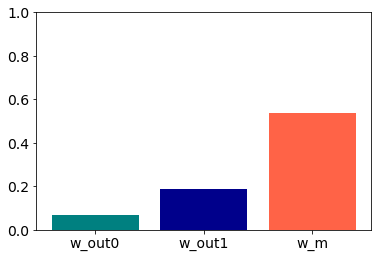

5it [00:00, 48.80it/s]

>> sig_rec: 0.05
M norm: 1.18	 M angle: 0.50, 5 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.18	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.65	 w_out vs. w_m angle: 0.32

500it [00:07, 66.09it/s]
1500it [00:39, 36.99it/s]
500it [00:09, 52.71it/s]


AR early fit 0.968, late fit 0.985


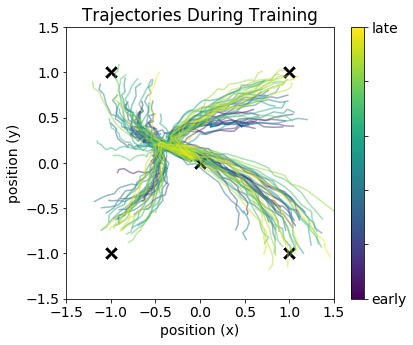

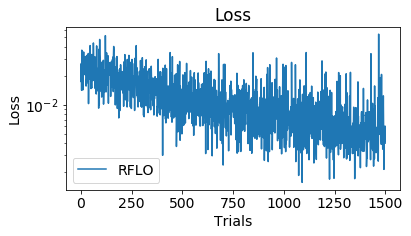

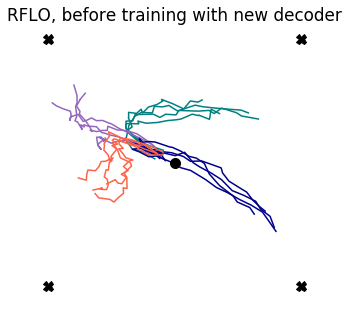

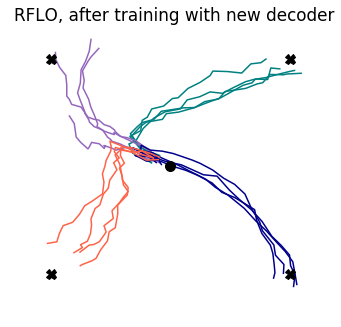

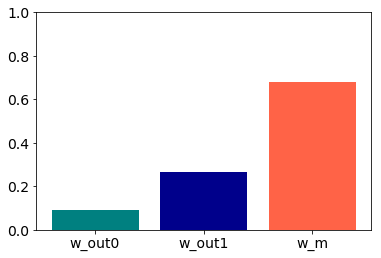

8it [00:00, 76.03it/s]

>> sig_rec: 0.10
M norm: 1.18	 M angle: 0.50, 5 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.18	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.65	 w_out vs. w_m angle: 0.32

500it [00:07, 62.42it/s]
1500it [00:34, 43.97it/s]
500it [00:07, 67.02it/s]


AR early fit 0.956, late fit 0.977


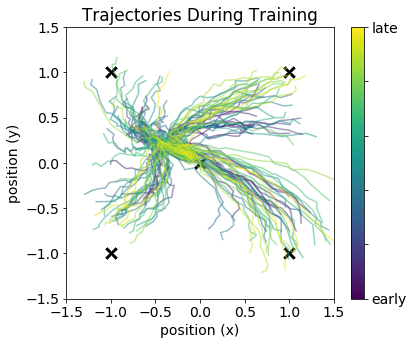

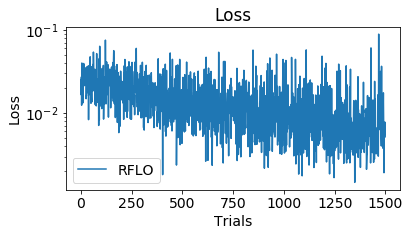

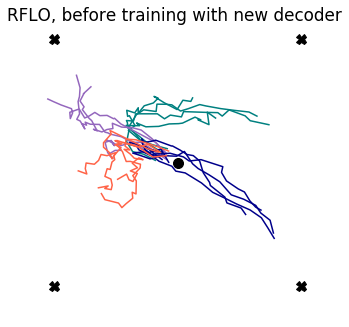

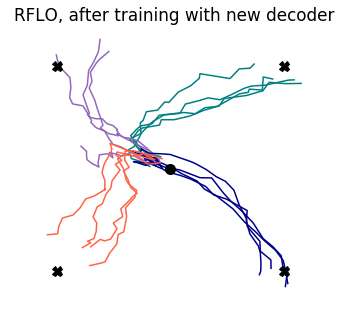

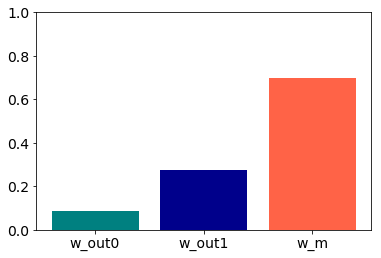

0it [00:00, ?it/s]

>> sig_rec: 0.25
M norm: 1.18	 M angle: 0.50, 5 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.18	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.65	 w_out vs. w_m angle: 0.32

500it [00:09, 51.34it/s]
1500it [00:38, 49.86it/s]
500it [00:07, 68.14it/s]


AR early fit 0.932, late fit 0.958


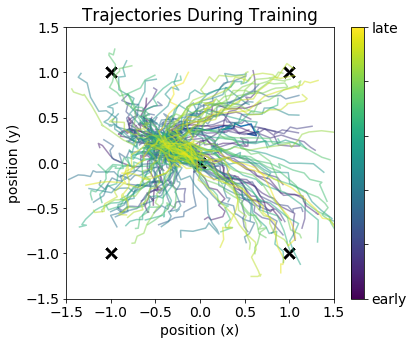

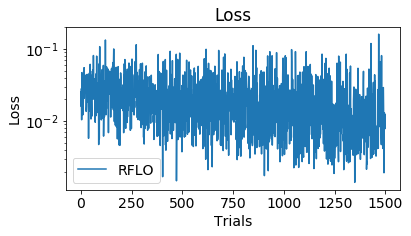

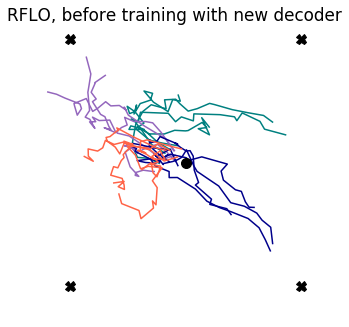

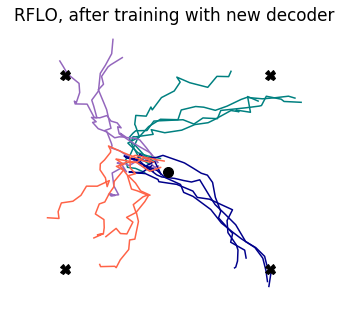

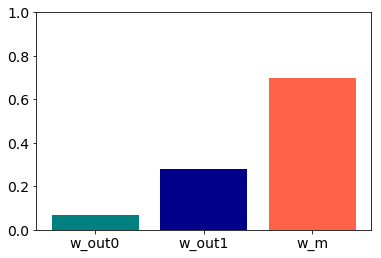

9it [00:00, 83.56it/s]

>> sig_rec: 0.50
M norm: 1.18	 M angle: 0.50, 5 iterations
w_out1 norm: 1.50	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.18	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.65	 w_out vs. w_m angle: 0.32

500it [00:07, 69.98it/s]
1500it [00:27, 54.74it/s]
500it [00:07, 68.73it/s]


AR early fit 0.909, late fit 0.932


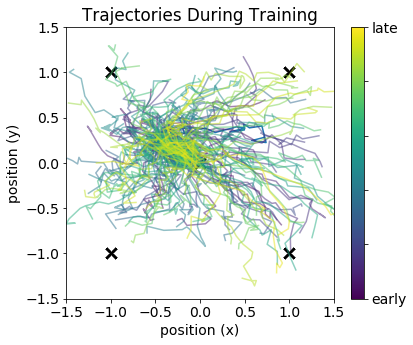

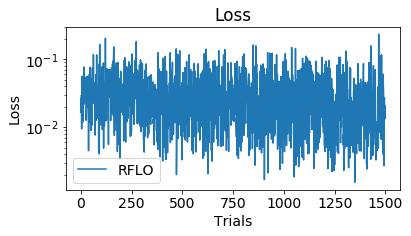

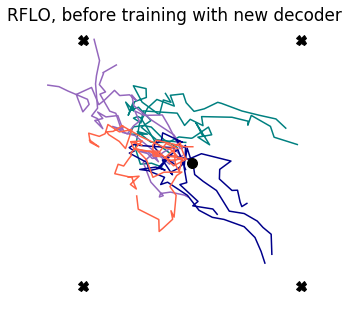

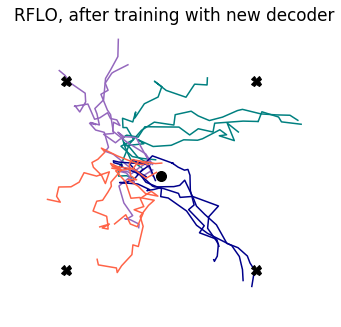

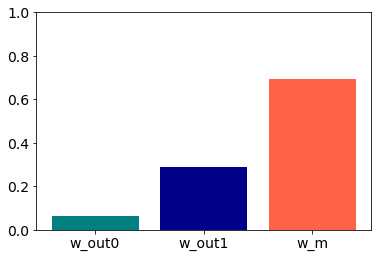

5it [00:00, 45.51it/s]

n_in: 4
n_rec: 50
n_out: 2
sig_in: 0.0
sig_rec: 0.25
sig_out: 0.01
tau_rec: 10
dt: 1.0
eta_in: 0.1
eta_rec: 0.1
eta_out: 0.1
g_in: 2.0
g_rec: 1.5
g_out: 2.0
g_fb: 2.0
driving_feedback: False
eta_fb: None
sig_fb: None
feedback_signal: position
velocity_transform: False
tau_vel: 0.8
dt_vel: 0.1
sig_rec_dim: None
eta_m: None
sig_m: None
lam_m: None
rng: <mtrand.RandomState object at 0x7fbc283852d0>
>>net0, not linear


2500it [00:44, 56.79it/s]
8it [00:00, 75.41it/s]

>> sig_rec: 0.01
M norm: 1.10	 M angle: 0.51, 27 iterations
w_out1 norm: 1.46	 w_out vs. w_out1 angle: 0.49
w_m norm: 1.10	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.75	 w_out vs. w_m angle: 0.15

500it [00:07, 73.23it/s]
1500it [00:22, 68.16it/s]
500it [00:04, 117.07it/s]


AR early fit 0.977, late fit 0.990


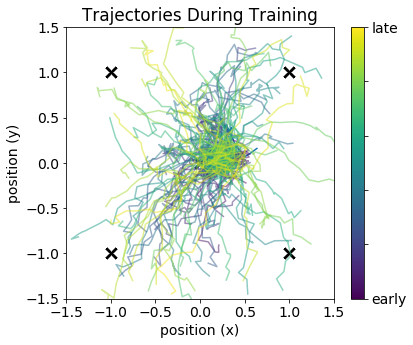

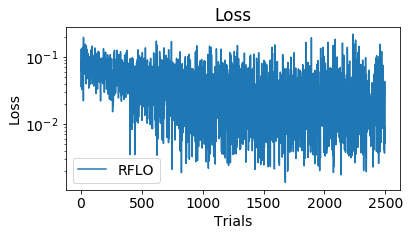

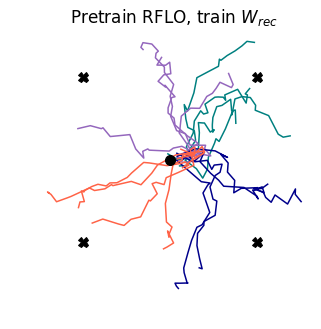

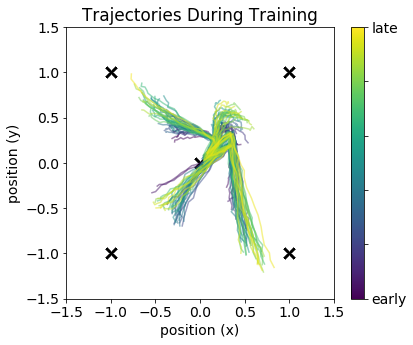

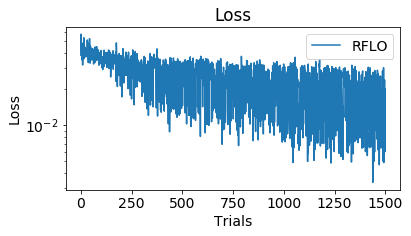

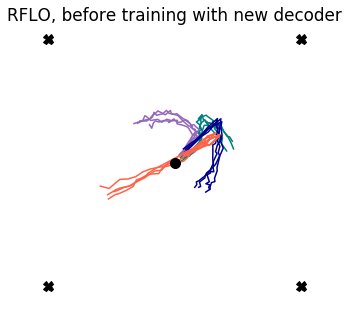

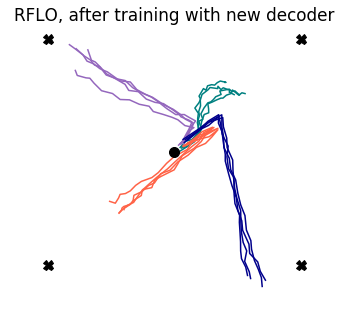

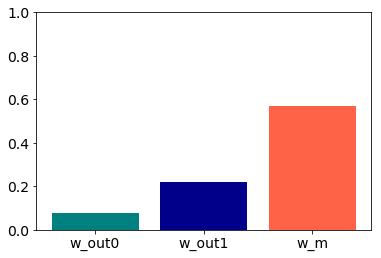

6it [00:00, 56.09it/s]

>> sig_rec: 0.05
M norm: 1.10	 M angle: 0.51, 27 iterations
w_out1 norm: 1.46	 w_out vs. w_out1 angle: 0.49
w_m norm: 1.10	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.75	 w_out vs. w_m angle: 0.15

500it [00:05, 94.76it/s] 
1500it [00:18, 83.24it/s]
500it [00:04, 106.42it/s]


AR early fit 0.963, late fit 0.983


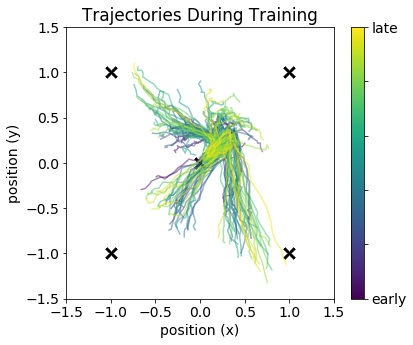

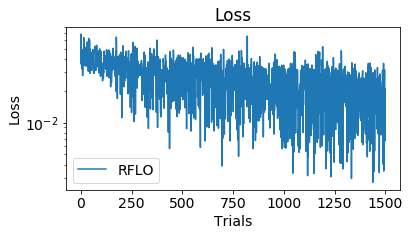

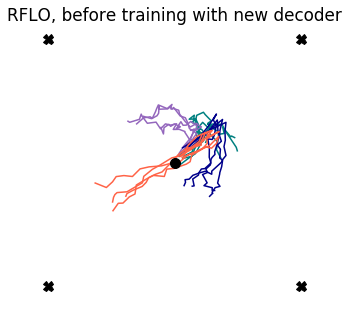

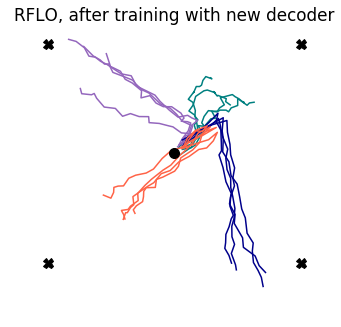

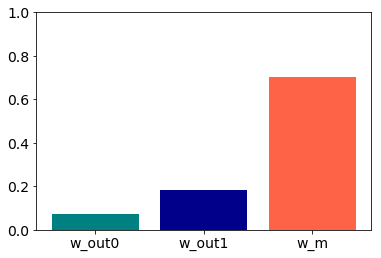

6it [00:00, 59.31it/s]

>> sig_rec: 0.10
M norm: 1.10	 M angle: 0.51, 27 iterations
w_out1 norm: 1.46	 w_out vs. w_out1 angle: 0.49
w_m norm: 1.10	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.75	 w_out vs. w_m angle: 0.15

500it [00:04, 102.41it/s]
1500it [00:17, 83.85it/s]
500it [00:04, 114.30it/s]


AR early fit 0.951, late fit 0.975


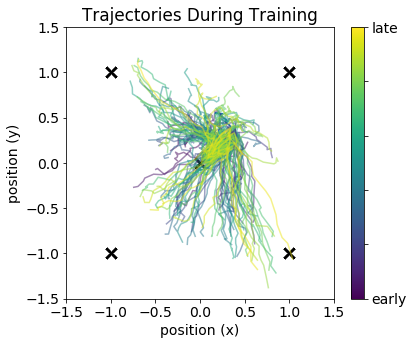

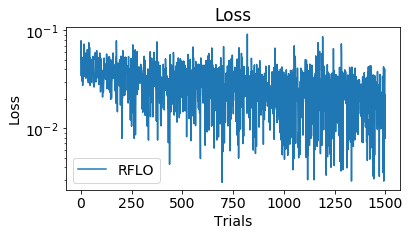

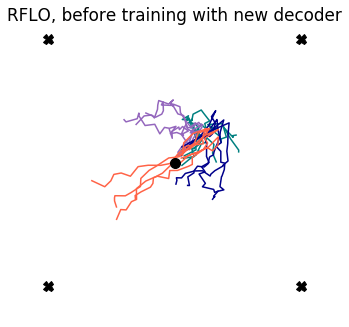

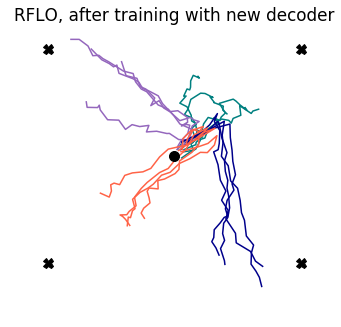

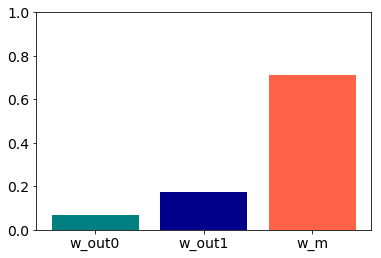

7it [00:00, 68.10it/s]

>> sig_rec: 0.25
M norm: 1.10	 M angle: 0.51, 27 iterations
w_out1 norm: 1.46	 w_out vs. w_out1 angle: 0.49
w_m norm: 1.10	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.75	 w_out vs. w_m angle: 0.15

500it [00:05, 110.54it/s]
1500it [00:17, 85.97it/s]
500it [00:04, 112.49it/s]


AR early fit 0.927, late fit 0.955


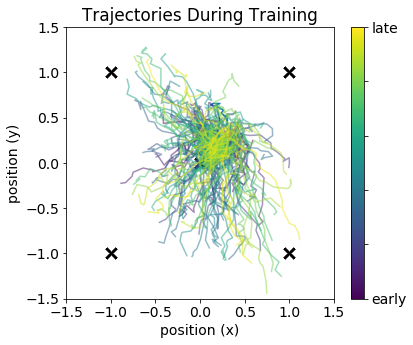

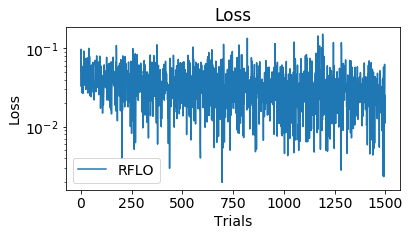

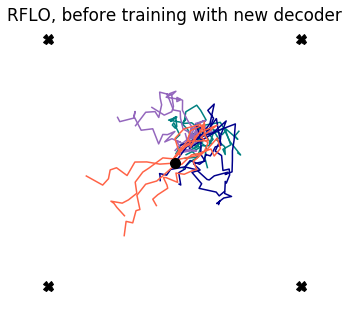

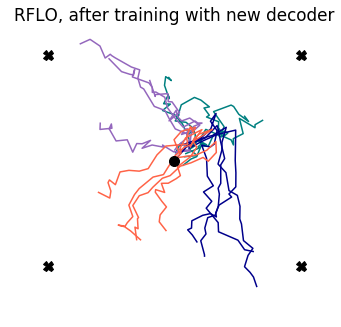

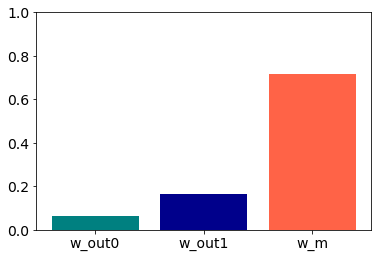

7it [00:00, 67.07it/s]

>> sig_rec: 0.50
M norm: 1.10	 M angle: 0.51, 27 iterations
w_out1 norm: 1.46	 w_out vs. w_out1 angle: 0.49
w_m norm: 1.10	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.75	 w_out vs. w_m angle: 0.15

500it [00:04, 119.03it/s]
1500it [00:17, 86.45it/s]
500it [00:05, 97.19it/s]


AR early fit 0.905, late fit 0.930


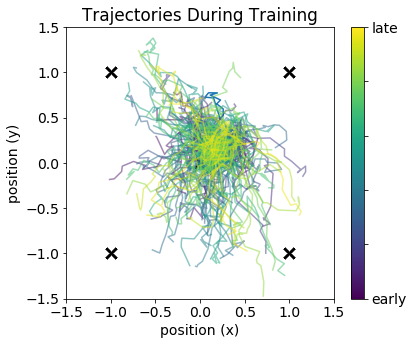

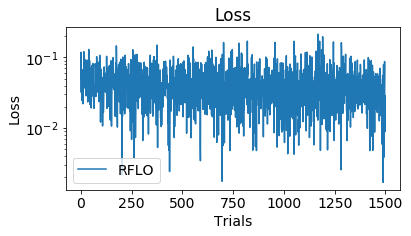

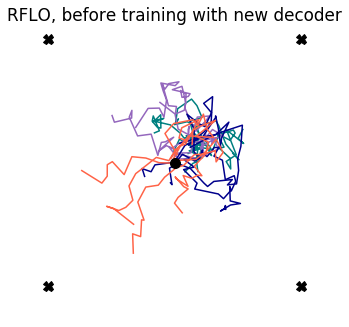

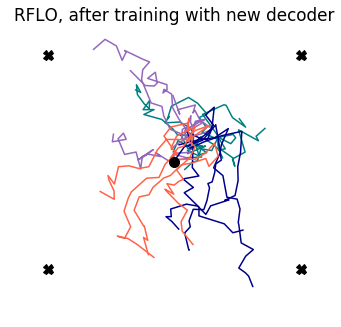

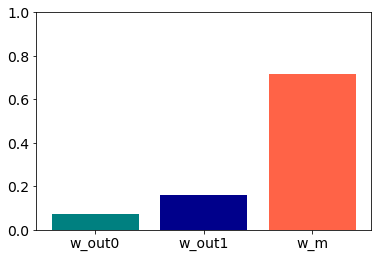

5it [00:00, 45.72it/s]

n_in: 4
n_rec: 50
n_out: 2
sig_in: 0.0
sig_rec: 0.25
sig_out: 0.01
tau_rec: 10
dt: 1.0
eta_in: 0.1
eta_rec: 0.1
eta_out: 0.1
g_in: 2.0
g_rec: 1.5
g_out: 2.0
g_fb: 2.0
driving_feedback: False
eta_fb: None
sig_fb: None
feedback_signal: position
velocity_transform: False
tau_vel: 0.8
dt_vel: 0.1
sig_rec_dim: None
eta_m: None
sig_m: None
lam_m: None
rng: <mtrand.RandomState object at 0x7fbc12407ca8>
>>net0, not linear


2500it [00:43, 57.89it/s]
7it [00:00, 65.99it/s]

>> sig_rec: 0.01
M norm: 1.17	 M angle: 0.51, 39 iterations
w_out1 norm: 1.51	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.17	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.75	 w_out vs. w_m angle: 0.23

500it [00:07, 66.64it/s]
1500it [00:27, 53.78it/s]
500it [00:07, 70.78it/s]


AR early fit 0.981, late fit 0.990


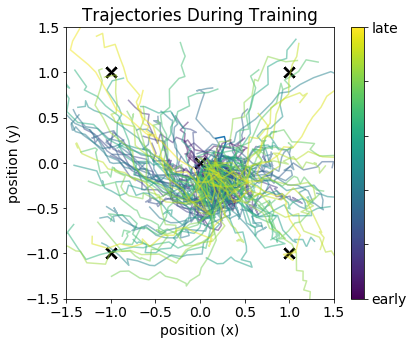

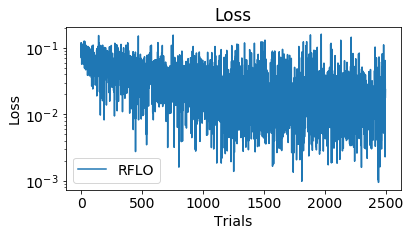

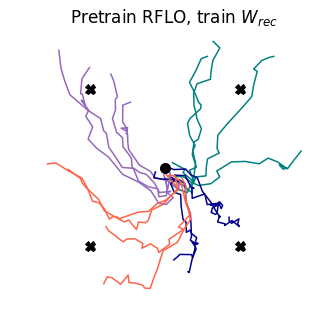

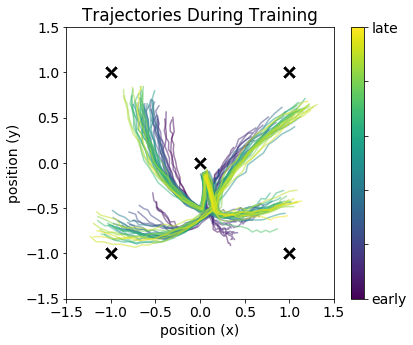

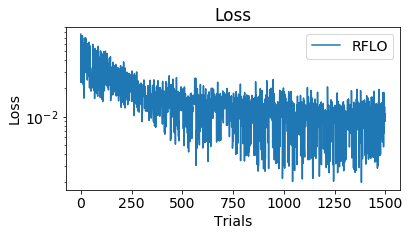

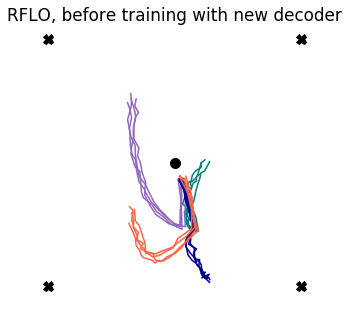

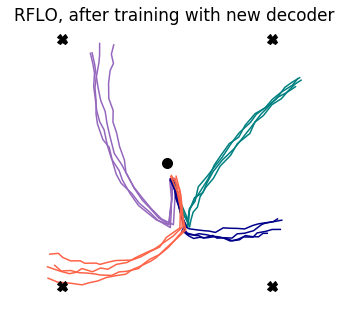

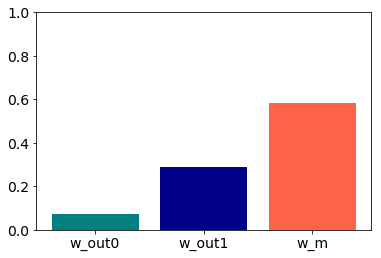

>> sig_rec: 0.05
M norm: 1.17	 M angle: 0.51, 39 iterations
w_out1 norm: 1.51	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.17	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.75	 w_out vs. w_m angle: 0.23

500it [00:06, 76.18it/s]
1500it [00:29, 50.95it/s]
500it [00:07, 69.99it/s]


AR early fit 0.966, late fit 0.982


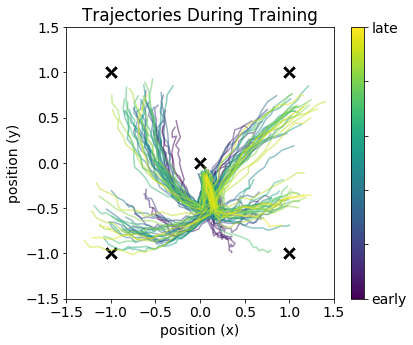

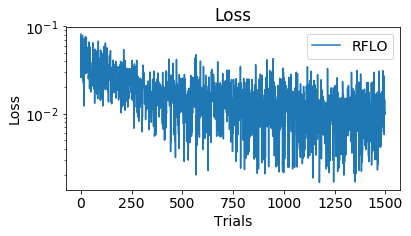

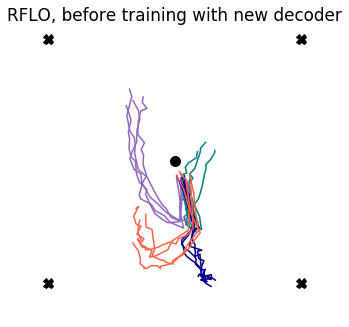

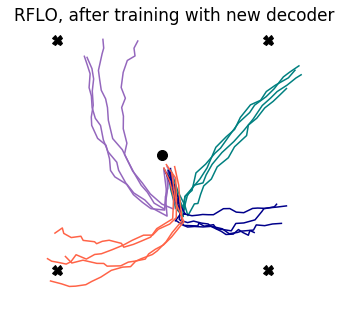

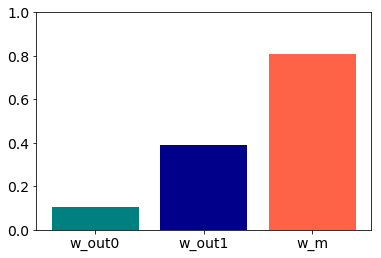

7it [00:00, 68.21it/s]

>> sig_rec: 0.10
M norm: 1.17	 M angle: 0.51, 39 iterations
w_out1 norm: 1.51	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.17	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.75	 w_out vs. w_m angle: 0.23

500it [00:07, 53.03it/s]
1500it [00:28, 53.51it/s]
500it [00:08, 55.88it/s]


AR early fit 0.953, late fit 0.973


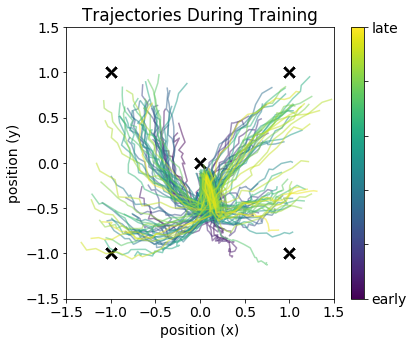

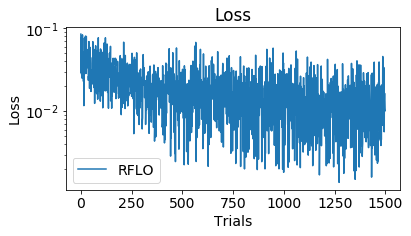

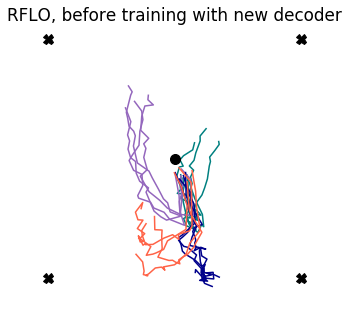

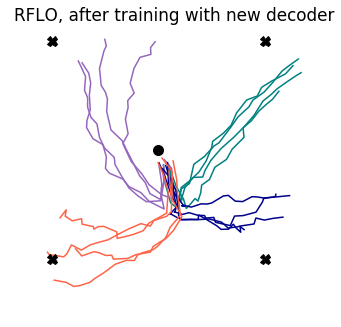

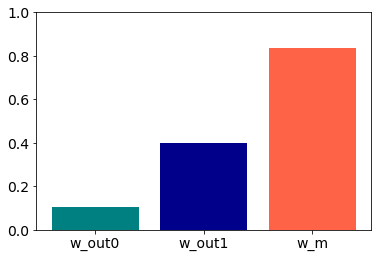

9it [00:00, 83.67it/s]

>> sig_rec: 0.25
M norm: 1.17	 M angle: 0.51, 39 iterations
w_out1 norm: 1.51	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.17	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.75	 w_out vs. w_m angle: 0.23

500it [00:05, 83.45it/s]
1500it [00:23, 63.42it/s]
500it [00:08, 57.04it/s]


AR early fit 0.926, late fit 0.951


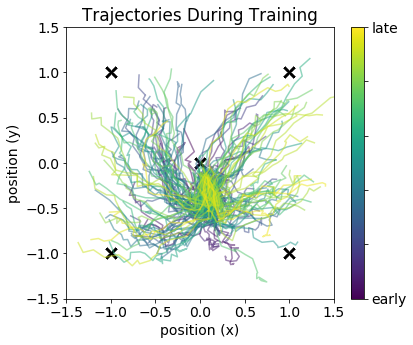

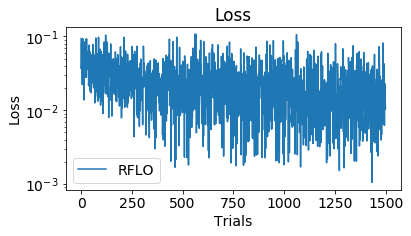

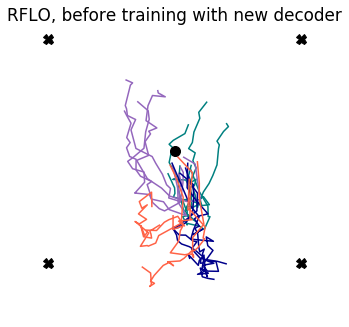

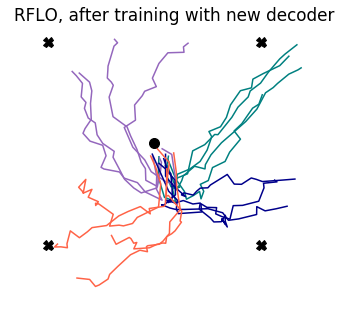

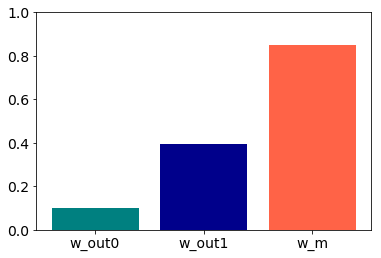

7it [00:00, 67.94it/s]

>> sig_rec: 0.50
M norm: 1.17	 M angle: 0.51, 39 iterations
w_out1 norm: 1.51	 w_out vs. w_out1 angle: 0.51
w_m norm: 1.17	 w_out1 vs. w_m angle: 0.51
w_m norm: 1.75	 w_out vs. w_m angle: 0.23

500it [00:07, 70.86it/s]
1500it [00:25, 59.71it/s]
500it [00:06, 73.28it/s]


AR early fit 0.901, late fit 0.924


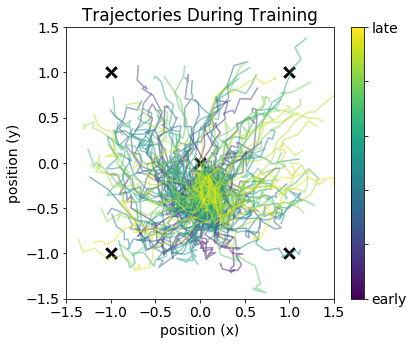

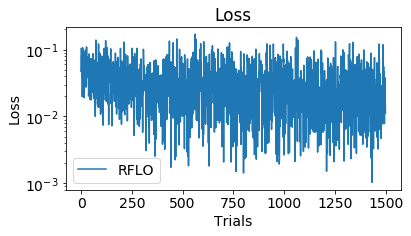

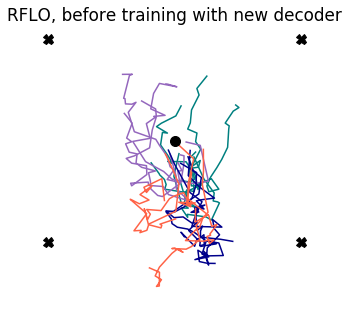

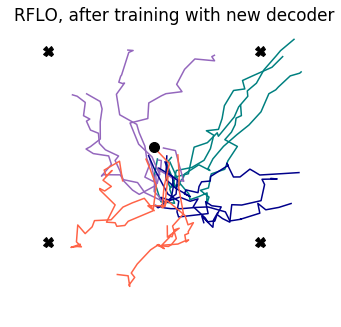

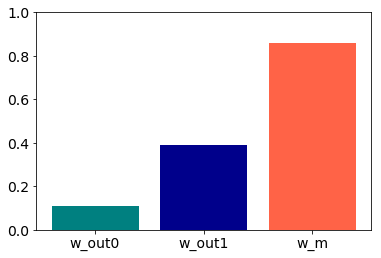

4it [00:00, 39.27it/s]

n_in: 4
n_rec: 50
n_out: 2
sig_in: 0.0
sig_rec: 0.25
sig_out: 0.01
tau_rec: 10
dt: 1.0
eta_in: 0.1
eta_rec: 0.1
eta_out: 0.1
g_in: 2.0
g_rec: 1.5
g_out: 2.0
g_fb: 2.0
driving_feedback: False
eta_fb: None
sig_fb: None
feedback_signal: position
velocity_transform: False
tau_vel: 0.8
dt_vel: 0.1
sig_rec_dim: None
eta_m: None
sig_m: None
lam_m: None
rng: <mtrand.RandomState object at 0x7fbc11b18630>
>>net0, not linear


2500it [00:42, 59.35it/s]
11it [00:00, 104.96it/s]

>> sig_rec: 0.01
M norm: 1.18	 M angle: 0.50, 3 iterations
w_out1 norm: 1.46	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.18	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.64	 w_out vs. w_m angle: 0.29

500it [00:04, 118.05it/s]
1500it [00:18, 81.30it/s]
500it [00:04, 109.60it/s]


AR early fit 0.985, late fit 0.993


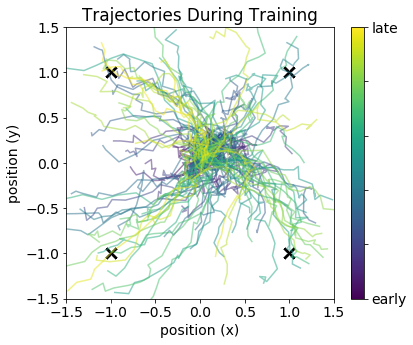

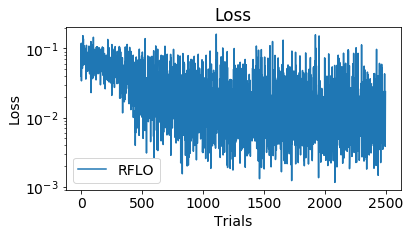

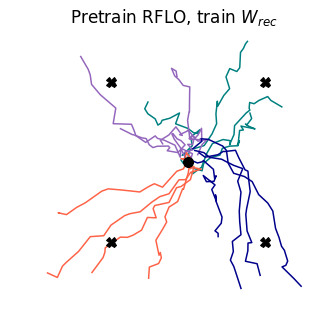

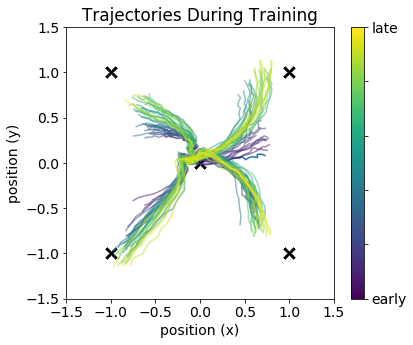

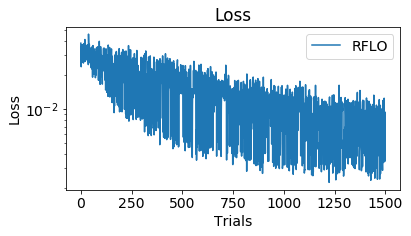

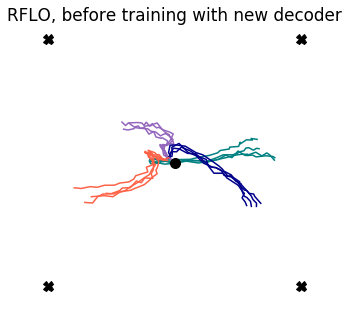

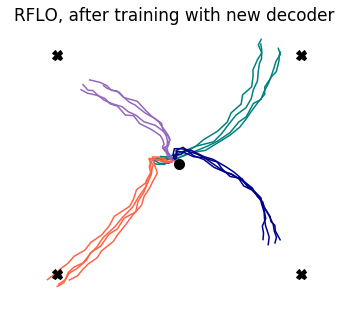

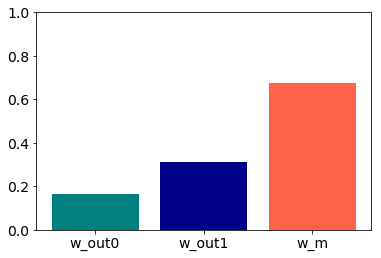

12it [00:00, 114.22it/s]

>> sig_rec: 0.05
M norm: 1.18	 M angle: 0.50, 3 iterations
w_out1 norm: 1.46	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.18	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.64	 w_out vs. w_m angle: 0.29

500it [00:04, 115.05it/s]
1500it [00:17, 85.07it/s]
500it [00:04, 110.95it/s]


AR early fit 0.974, late fit 0.986


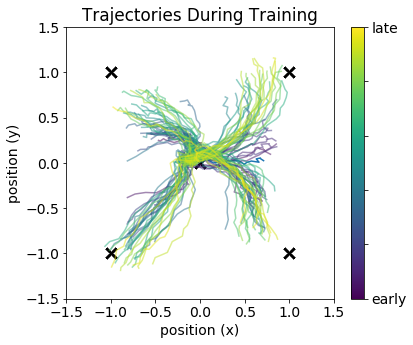

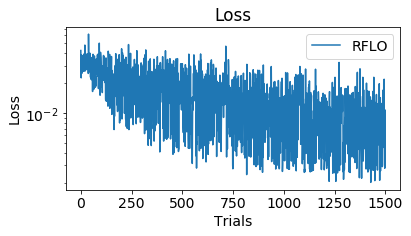

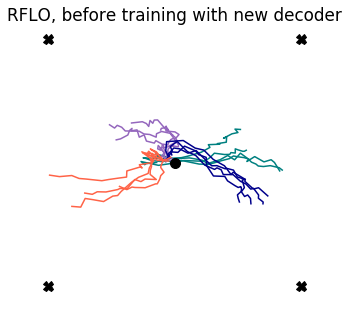

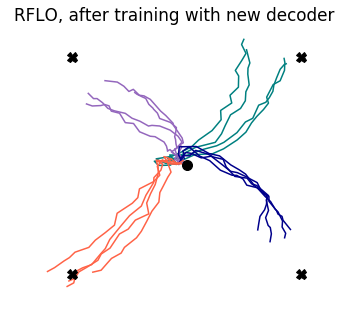

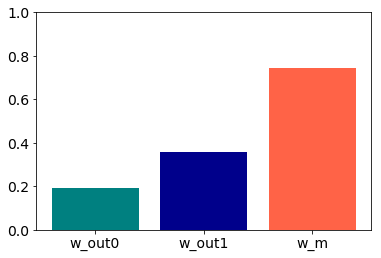

10it [00:00, 94.47it/s]

>> sig_rec: 0.10
M norm: 1.18	 M angle: 0.50, 3 iterations
w_out1 norm: 1.46	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.18	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.64	 w_out vs. w_m angle: 0.29

500it [00:04, 118.22it/s]
1500it [00:18, 82.13it/s]
500it [00:04, 106.40it/s]


AR early fit 0.964, late fit 0.979


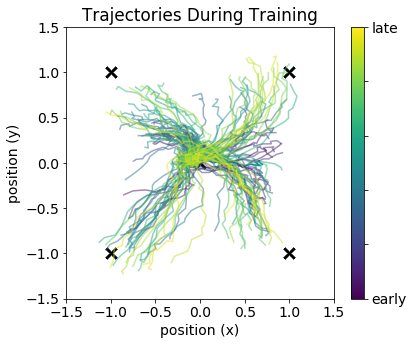

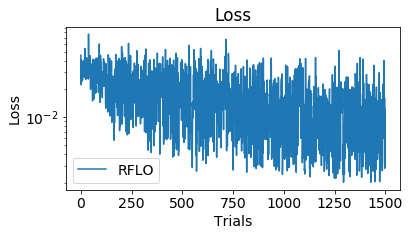

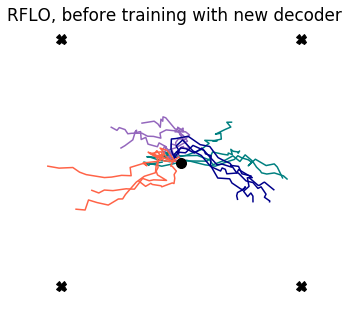

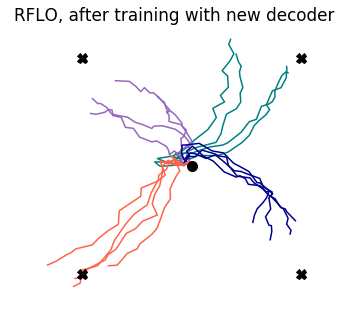

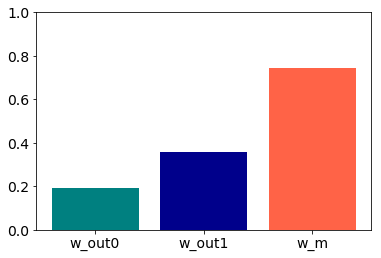

11it [00:00, 109.08it/s]

>> sig_rec: 0.25
M norm: 1.18	 M angle: 0.50, 3 iterations
w_out1 norm: 1.46	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.18	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.64	 w_out vs. w_m angle: 0.29

500it [00:04, 124.84it/s]
1500it [00:15, 97.99it/s]
500it [00:04, 122.75it/s]


AR early fit 0.941, late fit 0.961


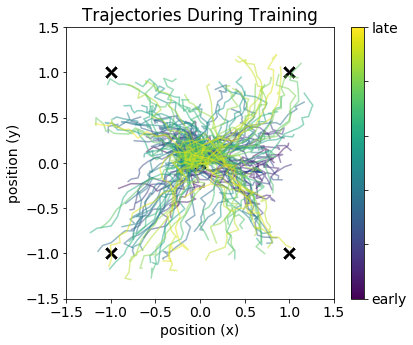

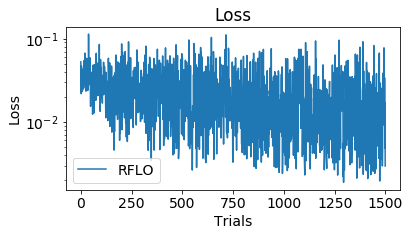

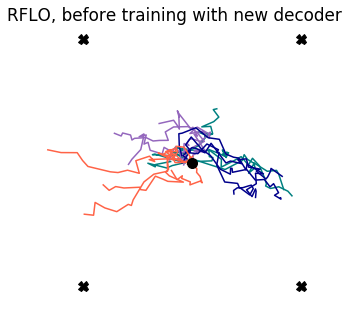

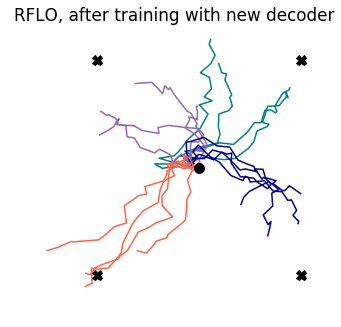

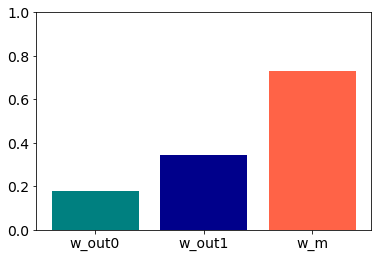

12it [00:00, 112.59it/s]

>> sig_rec: 0.50
M norm: 1.18	 M angle: 0.50, 3 iterations
w_out1 norm: 1.46	 w_out vs. w_out1 angle: 0.50
w_m norm: 1.18	 w_out1 vs. w_m angle: 0.50
w_m norm: 1.64	 w_out vs. w_m angle: 0.29

500it [00:04, 112.45it/s]
1500it [00:17, 85.32it/s]
500it [00:04, 111.45it/s]


AR early fit 0.916, late fit 0.936


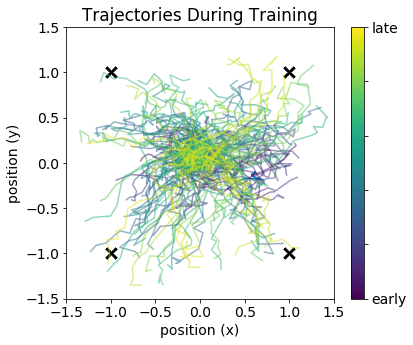

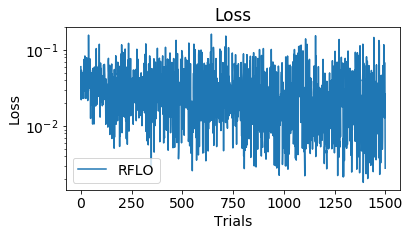

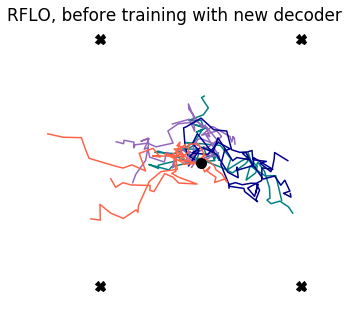

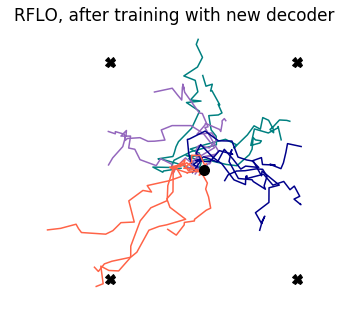

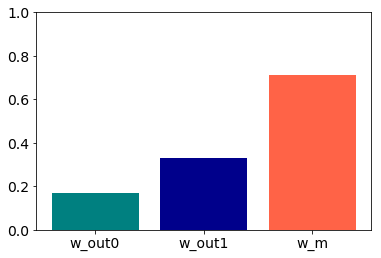

In [11]:
rnn_seed = 72
pretrain_duration = 2500
train_duration = 1500
test_duration = 500






""" Average over multiple seeds """
seeds = [0,1,2,3,4,5]#,22,33,47]
overlaps = [0.5]
n_changes = [50]
overlap_w_out0 = 0.5
n_change_w_out0 = 50

noise = [0.01,0.05,0.1,0.25,0.5]


stats = {}
stats['corr1'] = []
stats['corr2'] = []
stats['corr3'] = []
stats['corrcoef'] = []

stats['seeds'] = seeds
stats['overlaps'] = overlaps
stats['n_changes'] = n_changes
stats['overlap_w_out0'] = overlap_w_out0
stats['n_change_w_out0'] = n_change_w_out0
stats['frac_on'] = frac_on

stats['pretrain_duration'] = pretrain_duration
stats['train_duration'] = train_duration
stats['test_duration'] = test_duration
stats['rnn_seed'] = rnn_seed
stats['comments'] = 'vary overlap between M and w_out1'

for seed in seeds:

    corr1_list = []
    corr2_list = []
    corr3_list = []
    corrcoef_list = []
    
    
    
    
    
    
    # Set RNN Parameters
    params = RNNparams(n_in=4,n_rec=50,n_out=2,tau_rec=10,
                   eta_in=0.1,eta_rec=0.1,eta_out=0.1,
                   sig_in=0.0,sig_rec=0.25,sig_out=0.01,
                   velocity_transform=False, tau_vel = 0.8, dt_vel = 0.1,
                   rng=np.random.RandomState(seed))
    params.print_params()
    stats['RNNparams'] = params



    # Initialize RNN
    net0 = RNN(params)
    print('>>net0, not linear')
    sim0 = Simulation(net0)
    rflo = RFLO(net0,apply_to=['w_rec'],online=False)
    sim0.run_session(n_trials=pretrain_duration, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=20)

    fig0 = plot_trained_trajectories(sim=sim0, tasks=[task1,task2,task3,task4],title='Pretrain RFLO, train '+r'$W_{rec}$')



    

    #for overlap,n_change in zip(overlaps,n_changes):
    overlap = overlaps[0]
    n_change = n_changes[0]
    for sig_rec in noise:
        
        
        # Set RNN Parameters
        params_sigrec = RNNparams(n_in=4,n_rec=50,n_out=2,tau_rec=10,
               eta_in=0.1,eta_rec=0.1,eta_out=0.1,
               sig_in=0.0,sig_rec=sig_rec,sig_out=0.01,
               velocity_transform=False, tau_vel = 0.8, dt_vel = 0.1,
               rng=np.random.RandomState(rnn_seed)) # this seed doesn't matter
        
        print('>> sig_rec: {:.2f}'.format(sig_rec))
        
        """ let overlap between w_out0 and w_out1 be constant """
        w_out1 = choose_aligned_matrix(net0.w_out.copy(),n_change=n_change_w_out0,overlap=overlap_w_out0,rng=np.random.RandomState(seed),zero=False,tolerance=0.01,loop=1000)
        """ change overlap between w_out1 and w_m  """
        w_m = choose_aligned_matrix(w_out1,n_change=n_change,overlap=overlap,rng=np.random.RandomState(seed),zero=False,tolerance=0.01,loop=1000)

        # confirm overlap between w_out1 and w_out
        norm, angle = return_norm_and_angle(net0.w_out,w_out1)
        print('\nw_out1 norm: {:.2f}'.format(norm) + '\t w_out vs. w_out1 angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out1 and w_m
        norm, angle = return_norm_and_angle(w_out1,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out1 vs. w_m angle: {:.2f}'.format(angle),end='')

        # confirm overlap between w_out and w_m
        norm, angle = return_norm_and_angle(net0.w_out,w_m)
        print('\nw_m norm: {:.2f}'.format(norm) + '\t w_out vs. w_m angle: {:.2f}'.format(angle),end='')
        
        
        
        
        net1_pre = RNN(params_sigrec)
        net1_pre.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy())
        net1_pre.set_weights(w_out = w_out1)
        net1_pre.set_weights(w_m = w_m.T)

        # unfortunately I need to make a different network to maintain integrity of pre and post simulations for plotting
        net1 = RNN(params_sigrec)
        net1.set_weights(w_in=net0.w_in.copy(), w_rec=net0.w_rec.copy())
        net1.set_weights(w_out = w_out1)
        net1.set_weights(w_m = w_m.T)




        """ Track activity with new decoder, before training """

        sim1_pre = Simulation(net1_pre)
        trackvars = TrackVars(net1_pre,apply_to=[]) 
        sim1_pre.run_session(n_trials=test_duration, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)
        #fig = plot_trained_trajectories(sim=sim1_pre, tasks=[task1,task2,task3,task4],title='RFLO, before training with new decoder')

        """ Train with new decoder """

        sim1_train = Simulation(net1)
        rflo = RFLO(net1,apply_to=['w_rec'],online=False)
        sim1_train.run_session(n_trials=train_duration, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['h','loss','err'], plot=True, plot_freq=10)

        """ Track activity with new decoder, after training """
        net1_post = RNN(params_sigrec)
        net1_post.set_weights(w_in=net1.w_in.copy(), w_rec=net1.w_rec.copy())
        net1_post.set_weights(w_out = net1.w_out)
        net1_post.set_weights(w_m = net1.w_m)

        sim1_post = Simulation(net1_post)
        trackvars = TrackVars(net1_post,apply_to=[]) 
        sim1_post.run_session(n_trials=test_duration, tasks=[task1,task2,task3,task4], learn_alg=[trackvars], probe_types=['h','err'], plot=False, plot_freq=10)

        
        fig = plot_trained_trajectories(sim=sim1_pre, tasks=[task1,task2,task3,task4],title='RFLO, before training with new decoder')

        fig = plot_trained_trajectories(sim=sim1_post, tasks=[task1,task2,task3,task4],title='RFLO, after training with new decoder')
        
        
        """ Calculate F fields """
        F_early, score_early = flow_field_data(sim1_pre.session_probes['h'])
        F_late, score_late = flow_field_data(sim1_post.session_probes['h'])

        print('AR early fit {:.3f}, late fit {:.3f}'.format(score_early,score_late))

        Fdata = F_late - F_early

        # separate train and test data from sim1_train
        n_total = len(sim1_train.session_probes['h'])
        n_train = int(0.5 * n_total)
        idx_train = np.random.RandomState(1975+seed).choice(np.arange(0,n_total),size=n_train,replace=False).astype(int)
        idx_test = np.arange(0,n_total)[~idx_train].astype(int)
        #idx_test=idx_train

        h_train = np.asarray(sim1_train.session_probes['h'])[idx_train,:,:,:]
        err_train = np.asarray(sim1_train.session_probes['err'])[idx_train,:,:,:]

        Fpred_w_out = flow_field_predicted(net0.w_out,err_train,h_train)
        Fpred_w_out1 = flow_field_predicted(w_out1,err_train,h_train)
        Fpred_w_m = flow_field_predicted(w_m,err_train,h_train)

        h_test = np.asarray(sim1_train.session_probes['h'])[idx_test,:,:,:]

        corr1 = calculate_flow_field_correlation(Fpred_w_out,Fdata,h_test) # could also sample sim_test
        corr1_list.append(corr1)

        corr2 = calculate_flow_field_correlation(Fpred_w_out1,Fdata,h_test) # could also sample sim_test
        corr2_list.append(corr2)

        corr3 = calculate_flow_field_correlation(Fpred_w_m,Fdata,h_test) # could also sample sim_test
        corr3_list.append(corr3)
        
        fig,ax = plt.subplots(1,1)
        plt.bar([0,1,2],[corr1,corr2,corr3],tick_label=['w_out0','w_out1','w_m'],color=['teal','darkblue','tomato'])
        plt.ylim([0,1])
        plt.show()
        
        
        
        
        
        
    # update
    stats['corr1'].append(corr1_list)
    stats['corr2'].append(corr2_list)
    stats['corr3'].append(corr3_list)
    #stats['corrcoef'].append(corrcoef_list)



In [14]:
""" save dict with unique name """
stats_sig_rec = stats

""" save dict """

save = True
tag = 'sup-5-24-v2'


if save:
    
    with open(folder+'stats_sig_rec-'+tag+'.pickle', 'wb') as handle:
        pickle.dump(stats_sig_rec, handle, protocol=pickle.HIGHEST_PROTOCOL)
        
    print('\nsaved as '+folder+'stats_sig_rec-'+tag+'.pickle')



saved as figs-2022-5-24/stats_sig_rec-sup-5-24-v2.pickle


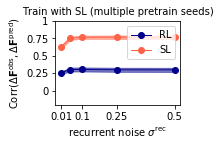

In [15]:
""" Same plot using flow field """
paper = True
save = True

fig,ax = plt.subplots(1,1,figsize=(6,4))

# """ Baseline Result from Main Figure """
# n_samples = len(stats_rflo_m['corr1'])
# mn1 = np.mean(np.asarray(stats_rflo_m['corr1']),axis=0)
# std1 = np.std(np.asarray(stats_rflo_m['corr1']),axis=0)
# sem1 = std1/np.sqrt(n_samples)


""" vary_sig_rec """
n_samples = len(stats_sig_rec['corr2'])
mn2 = np.mean(np.asarray(stats_sig_rec['corr2']),axis=0)
std2 = np.std(np.asarray(stats_sig_rec['corr2']),axis=0)
sem2 = std2/np.sqrt(n_samples)

mn3 = np.mean(np.asarray(stats_sig_rec['corr3']),axis=0)
std3 = np.std(np.asarray(stats_sig_rec['corr3']),axis=0)
sem3 = std3/np.sqrt(n_samples)


# plt.plot(overlaps,mn1,'o-',linewidth=1,label=r'$W^{bmi0}$',color='teal')
# plt.fill_between(overlaps,mn1-sem1,mn1+sem1,alpha=0.5,color='teal')

plt.plot(noise,mn2,'o-',linewidth=1,label='RL',color='darkblue')
plt.fill_between(noise,mn2-sem2,mn2+sem2,alpha=0.5,color='darkblue')

plt.plot(noise,mn3,'o-',linewidth=1,label='SL',color='tomato')
plt.fill_between(noise,mn3-sem3,mn3+sem3,alpha=0.5,color='tomato')


plt.ylim([-0.2,1])
plt.legend()
plt.title('Train with SL (multiple pretrain seeds)')
plt.xlabel('recurrent noise '+r'$\sigma^{\mathrm{rec}}$')
plt.ylabel('Corr'+r'$(\Delta \mathbf{F}^{\mathrm{obs}}, \Delta \mathbf{F}^{\mathrm{pred}})$')

plt.tight_layout()

if paper:
    fig,ax = paper_format(fig=fig,ax=ax,xlabels=[0.01,0.1,0.25,0.5],ylabels=[0,0.25,0.5,0.75,1],ticksize=10,linewidth=2,ylim=[-.2,1],figsize=(2.25,3))

plt.show()

if save:
    if paper:
        fig.savefig(folder+'sup-sig-rec-v2.pdf')
    else:
        fig.savefig(folder+'sup-sig-rec-v2.pdf')
